**Credit Card Fraud Transaction Data**

Shenoy, K. (2019). Credit Card Transactions Fraud Detection Dataset. Kaggle.com. https://www.kaggle.com/datasets/kartik2112/fraud-detection

***Reading in the dataset and importing relevant packages***

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import time
import datetime
import calendar
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFECV
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve

In [ ]:
fraud_train = pd.read_csv('/content/drive/MyDrive/CIND 820/fraudTrain.csv')
fraud_train.shape[0]

1296675

In [ ]:
fraud_test = pd.read_csv('/content/drive/MyDrive/CIND 820/fraudTest.csv')
fraud_test.shape[0]

555719

In [ ]:
fraud = pd.concat([fraud_train, fraud_test])
fraud.shape[0] # Gives total number of observations

1852394

In [ ]:
fraud.head(5)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


***Data Cleaning***

In [ ]:
fraud.dtypes

Unnamed: 0                 int64
trans_date_trans_time     object
cc_num                     int64
merchant                  object
category                  object
amt                      float64
first                     object
last                      object
gender                    object
street                    object
city                      object
state                     object
zip                        int64
lat                      float64
long                     float64
city_pop                   int64
job                       object
dob                       object
trans_num                 object
unix_time                  int64
merch_lat                float64
merch_long               float64
is_fraud                   int64
dtype: object

In [ ]:
pd.value_counts(fraud.dtypes) # Shows the frequency of the relevant data types in data set

object     12
int64       6
float64     5
dtype: int64

Checking the data types for all the variables in the dataset, we can see that trans_date_trans_time and dob (date of birth) are of an 'object' data type, which is not correct.

Knowing this, both of these variables need to be converted into their appropriate data type, which is datetime.

In [ ]:
fraud[['trans_date_trans_time', 'dob']] = fraud[['trans_date_trans_time', 'dob']].apply(pd.to_datetime)
fraud.dtypes[['trans_date_trans_time', 'dob']] # Check

trans_date_trans_time    datetime64[ns]
dob                      datetime64[ns]
dtype: object

Looking first with trans_date_trans_time, we can extract the month, year, and day of the week of each observation and create a variable for each one.

In [ ]:
# For transaction month
fraud['month'] = fraud['trans_date_trans_time'].dt.month_name()
fraud['month'].head(5) # Check

0    January
1    January
2    January
3    January
4    January
Name: month, dtype: object

In [ ]:
fraud['month'].value_counts() # Displays the frequency for each month

December     280598
August       176118
June         173869
July         172444
May          146875
March        143789
November     143056
September    140185
October      138106
April        134970
January      104727
February      97657
Name: month, dtype: int64

Examing the distribution of the number of observations by month, it is shown that December appears more frequently in the data set where 280,598 observations out of 1,852,394 observations are in that month. It can be inferred that this is most likely due to people shopping for the holiday season.

In [ ]:
# For transaction day
fraud['day'] = fraud['trans_date_trans_time'].dt.strftime('%A')

In [ ]:
fraud['day'].value_counts() # Displays the frequency of each day of the week

Monday       369418
Sunday       343677
Tuesday      270340
Saturday     263227
Friday       215078
Thursday     206741
Wednesday    183913
Name: day, dtype: int64

As for days, approximately 19.94% of the observations are assigned to Monday, meaning that most people conduct their transactions on a Monday.

In [ ]:
# For transaction year
fraud['year'] = fraud['trans_date_trans_time'].dt.strftime('%Y')

In [ ]:
fraud['year'].value_counts() # Displays the distribution between the 2 years

2020    927544
2019    924850
Name: year, dtype: int64

In terms of years, both 2019 and 2020 are almost equally repsented in the data set, 49.93% and 50.07% respectively.

Similarly, we can use 'dob' to create an age variable.

In [ ]:
difference = fraud['trans_date_trans_time'] - fraud['dob']
fraud['age'] = difference.dt.days // 365

In [ ]:
fraud['age'].head(5) # Check

0    30
1    40
2    56
3    52
4    32
Name: age, dtype: int64

Now that we have gathered and generated a year, month, weekday, and age variable from 'trans_date_trans_time' and 'dob', we can drop both of these variables from the dataset. As well, we can also drop 'Unnamed: 0' as it does not contain valuable information to aid in our analysis.

In [ ]:
fraud = fraud.drop(['trans_date_trans_time', 'dob', 'Unnamed: 0'], axis=1)

Looking back at the data types above, we see that 'cc_num' (credit card number) and zip' are of numeric data type (int64). Since credit card number serves as an identifer and that zip code is a type of geographic information, it would need to be converted into a categorical data type as peforming numerical calculations for both would not output anything useful.


In [ ]:
fraud[['cc_num','zip']] = fraud[['cc_num', 'zip']].apply(str)

***Exploring the data***

Checking again the first 5 observations of the dataset.

In [ ]:
fraud.head(5)

,cc_num,merchant,category,amt,first,last,gender,street,city,state,...,job,trans_num,unix_time,merch_lat,merch_long,is_fraud,month,day,year,age
0,0 2703186189652095\n1 6304...,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,...,"Psychologist, counselling",0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,January,Tuesday,2019,30
1,0 2703186189652095\n1 6304...,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,...,Special educational needs teacher,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,January,Tuesday,2019,40
2,0 2703186189652095\n1 6304...,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,...,Nature conservation officer,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,January,Tuesday,2019,56
3,0 2703186189652095\n1 6304...,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,MT,...,Patent attorney,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,January,Tuesday,2019,52
4,0 2703186189652095\n1 6304...,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,VA,...,Dance movement psychotherapist,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,January,Tuesday,2019,32


In [ ]:
fraud.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1852394 entries, 0 to 555718
Data columns (total 24 columns):
 #   Column      Dtype  
---  ------      -----  
 0   cc_num      object 
 1   merchant    object 
 2   category    object 
 3   amt         float64
 4   first       object 
 5   last        object 
 6   gender      object 
 7   street      object 
 8   city        object 
 9   state       object 
 10  zip         object 
 11  lat         float64
 12  long        float64
 13  city_pop    int64  
 14  job         object 
 15  trans_num   object 
 16  unix_time   int64  
 17  merch_lat   float64
 18  merch_long  float64
 19  is_fraud    int64  
 20  month       object 
 21  day         object 
 22  year        object 
 23  age         int64  
dtypes: float64(5), int64(4), object(15)
memory usage: 353.3+ MB


In [ ]:
fraud.describe()

,amt,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud,age
count,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06
mean,7.006357e+01,3.853931e+01,-9.022783e+01,8.864367e+04,1.358674e+09,3.853898e+01,-9.022794e+01,5.210015e-03,4.579690e+01
std,1.592540e+02,5.071470e+00,1.374789e+01,3.014876e+05,1.819508e+07,5.105604e+00,1.375969e+01,7.199217e-02,1.742393e+01
min,1.000000e+00,2.002710e+01,-1.656723e+02,2.300000e+01,1.325376e+09,1.902742e+01,-1.666716e+02,0.000000e+00,1.300000e+01
25%,9.640000e+00,3.466890e+01,-9.679800e+01,7.410000e+02,1.343017e+09,3.474012e+01,-9.689944e+01,0.000000e+00,3.200000e+01
50%,4.745000e+01,3.935430e+01,-8.747690e+01,2.443000e+03,1.357089e+09,3.936890e+01,-8.744069e+01,0.000000e+00,4.400000e+01
75%,8.310000e+01,4.194040e+01,-8.015800e+01,2.032800e+04,1.374581e+09,4.195626e+01,-8.024511e+01,0.000000e+00,5.700000e+01
max,2.894890e+04,6.669330e+01,-6.795030e+01,2.906700e+06,1.388534e+09,6.751027e+01,-6.695090e+01,1.000000e+00,9.600000e+01


In [ ]:
fraud.isna().values.sum()

0

There are no missing values in the dataset.

[]

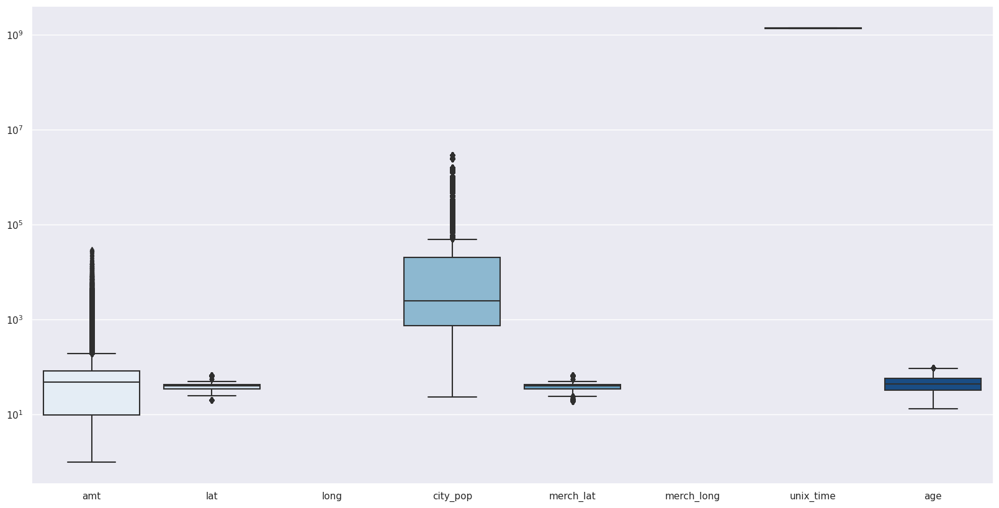

In [ ]:
# Detecting Outliers

sns.set(rc={'figure.figsize': (20,10)})
sns.boxplot(data=fraud[['amt','lat', 'long','city_pop','merch_lat', 'merch_long','unix_time', 'age']], orient='v',palette='Blues')
plt.semilogy()

<Axes: xlabel='lat'>

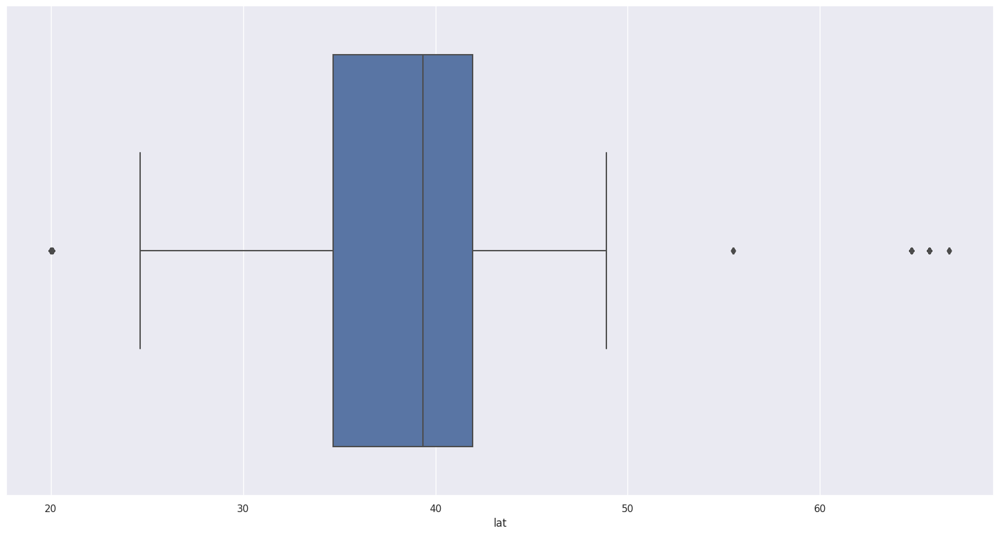

In [ ]:
sns.boxplot(x=fraud['lat'])

<Axes: xlabel='long'>

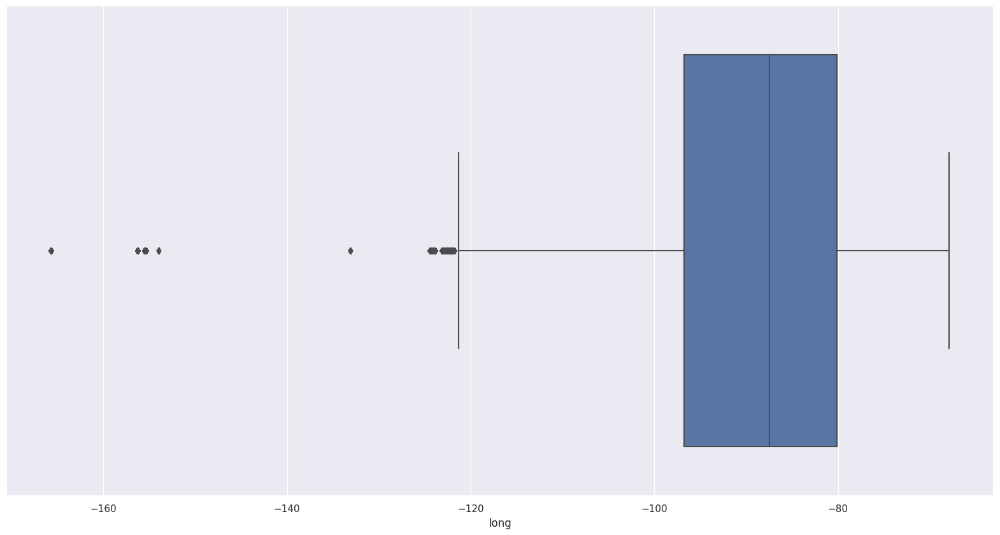

In [ ]:
sns.boxplot(x=fraud['long'])

<Axes: xlabel='merch_lat'>

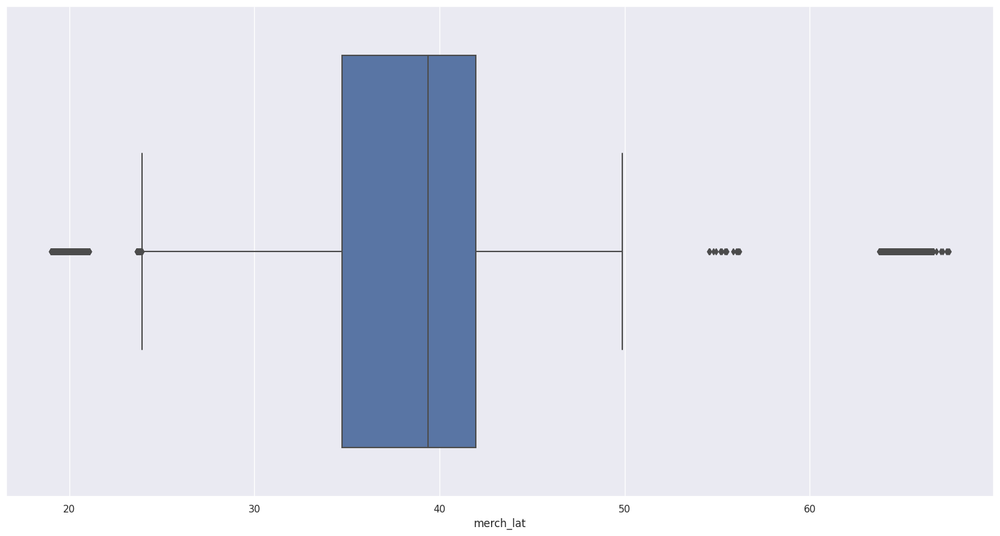

In [ ]:
sns.boxplot(x=fraud['merch_lat'])

<Axes: xlabel='merch_long'>

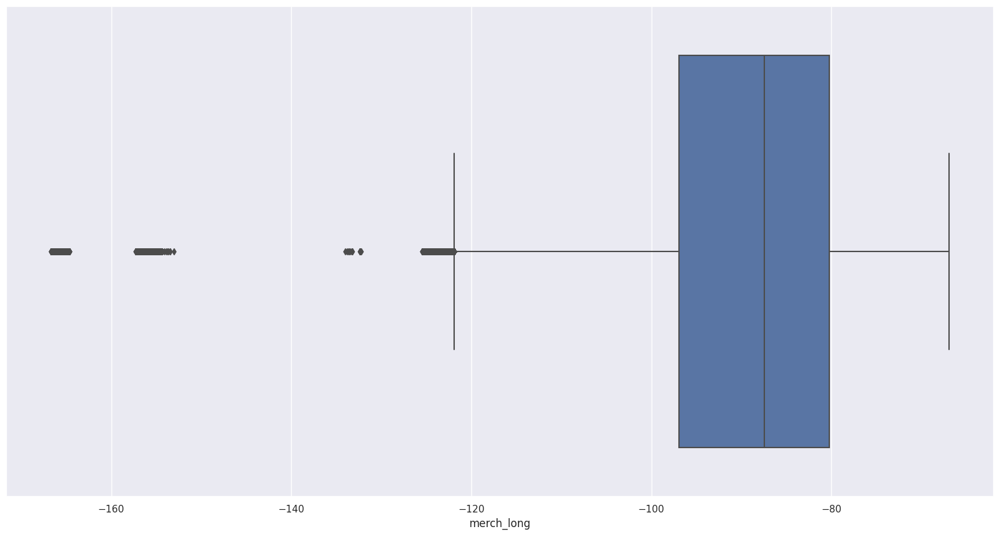

In [ ]:
sns.boxplot(x=fraud['merch_long'])

<Axes: xlabel='age'>

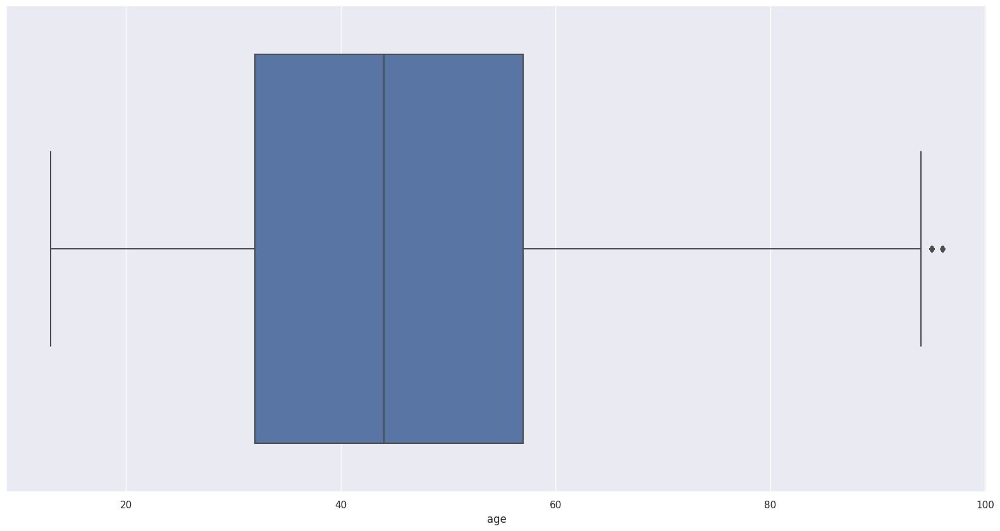

In [ ]:
sns.boxplot(x=fraud['age'])

In [ ]:
def locate_outliers(fraud):
  Q1 = fraud.quantile(0.25)
  Q3 = fraud.quantile(0.75)
  IQR = Q3 - Q1
  outliers = fraud[((fraud < (Q1 - 1.5 * IQR)) | (fraud > (Q3 + 1.5 * IQR)))]
  return outliers

In [ ]:
outliers = locate_outliers(fraud[['amt', 'lat', 'long', 'city_pop', 'merch_lat', 'merch_long', 'age']])
outliers.count()

amt            95054
lat             6612
long           71026
city_pop      346191
merch_lat       7063
merch_long     59972
age              455
dtype: int64

Observing the boxplots, it is clear that each of the numeric features contain outliers.

In [ ]:
fraud.nunique()

cc_num              1
merchant          693
category           14
amt             60616
first             355
last              486
gender              2
street            999
city              906
state              51
zip                 1
lat               983
long              983
city_pop          891
job               497
trans_num     1852394
unix_time     1819583
merch_lat     1754157
merch_long    1809753
is_fraud            2
month              12
day                 7
year                2
age                84
dtype: int64

The values above displays the number of unique values for each variable.

Checking the distribution of variables with binary values

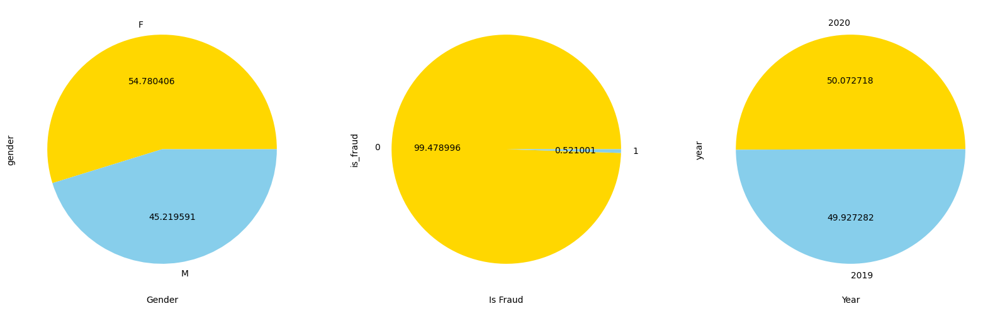

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(20,30))
fraud['gender'].value_counts().plot(kind='pie', autopct='%2f', colors=['gold', 'skyblue'], ax=ax1)
fraud['is_fraud'].value_counts().plot(kind='pie', autopct='%2f', colors=['gold', 'skyblue'], ax=ax2)
fraud['year'].value_counts().plot(kind='pie', autopct='%2f', colors=['gold', 'skyblue'], ax=ax3)

ax1.set_xlabel('Gender')
ax2.set_xlabel('Is Fraud')
ax3.set_xlabel('Year')
plt.show()

The above pie charts illustrate the proportion of the binary values for gender, is_fraud, and year. For gender, 54.78% of observations in the data set are females while the remaining 45.22% are males. As for fraud, there is a clear imbalance between the 2 classes where 99.48% of the transactions are classified as not fraudulent whereas only 0.52% are fraudulent. Therefore, a resampling technique(s) needs to be applied to overcome the issue of imbalance. Lastly, as mentioned earlier, the distribution for year is almost equal, indicating equal representation of the years in the data set.

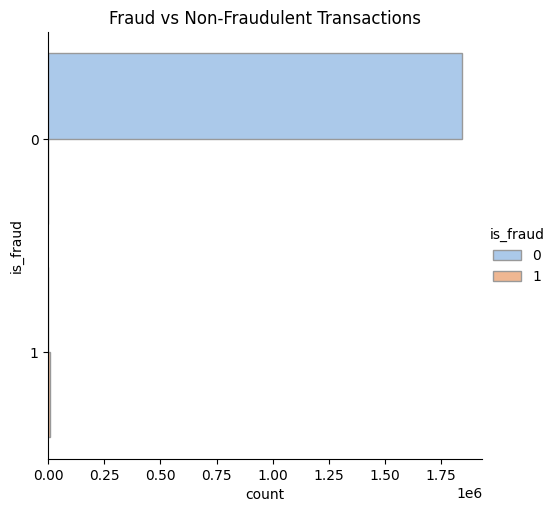

In [ ]:
sns.catplot(
    data = fraud, y='is_fraud', hue='is_fraud', kind='count',
    palette="pastel", edgecolor=".6"
).set(title = 'Fraud vs Non-Fraudulent Transactions')

Again, but in the form of a horizontal barplot, this shows the unequal distribution between legitmate and fraudulent transactions and we can still see that majority of the transactions are classified as legitimate.

In [ ]:
top_10_city = fraud['city'].value_counts().sort_values(ascending=False)
top_10_city = top_10_city.head(10)
top_10_city

Birmingham     8040
San Antonio    7312
Utica          7309
Phoenix        7297
Meridian       7289
Warren         6584
Conway         6574
Cleveland      6572
Thomas         6571
Houston        5865
Name: city, dtype: int64

In [ ]:
top_10_states = fraud['state'].value_counts().sort_values(ascending=False)
top_10_states = top_10_states.head(10)
top_10_states

TX    135269
NY    119419
PA    114173
CA     80495
OH     66627
MI     65825
IL     62212
FL     60775
AL     58521
MO     54904
Name: state, dtype: int64

In [ ]:
top_10_jobs = fraud['job'].value_counts().sort_values(ascending=False)
top_10_jobs = top_10_jobs.head(10)
top_10_jobs

Film/video editor             13898
Exhibition designer           13167
Surveyor, land/geomatics      12436
Naval architect               12434
Materials engineer            11711
Designer, ceramics/pottery    11688
Environmental consultant      10974
Financial adviser             10963
Systems developer             10962
IT trainer                    10943
Name: job, dtype: int64

Given that city, state, and job have large unique values (city: 906, state: 51, job: 497), it would be difficult to visualize each in a barplot. Therefore, to overcome this, I took the top 10 cities, states, and jobs based on their frequency to ease the analysis.

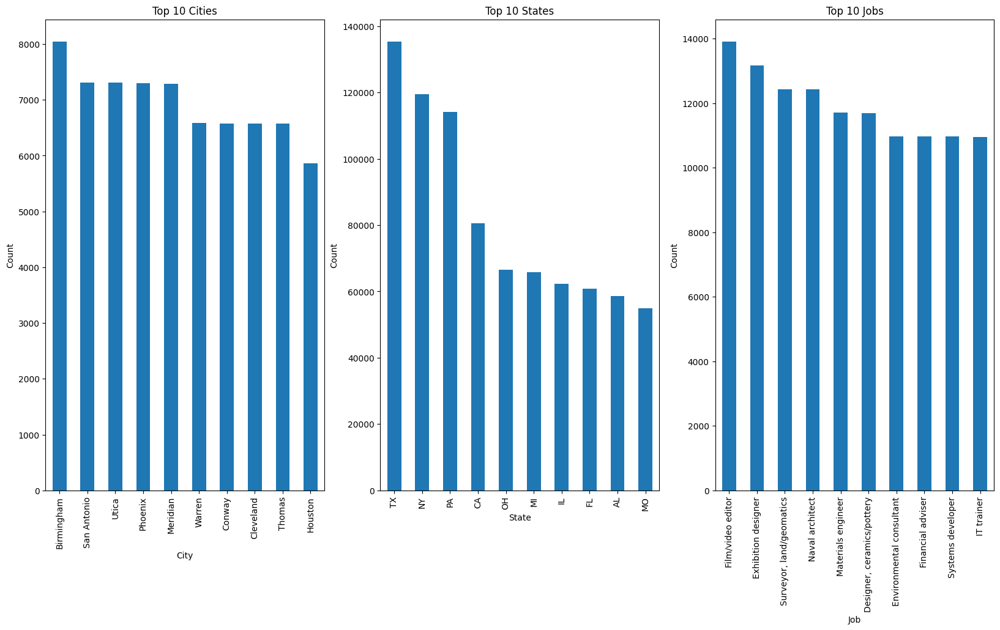

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(20,10))
top_10_city.plot(kind='bar', ax=ax[0]).set_title('Top 10 Cities')
top_10_states.plot(kind='bar', ax=ax[1]).set_title('Top 10 States')
top_10_jobs.plot(kind='bar', ax=ax[2]).set_title('Top 10 Jobs')

ax[0].set_xlabel('City')
ax[1].set_xlabel('State')
ax[2].set_xlabel('Job')

ax[0].set_ylabel('Count')
ax[1].set_ylabel('Count')
ax[2].set_ylabel('Count')
plt.show()

The above bar plots displays each of the top 10 observations for city, state, and job. Looking at each plot, starting with city, majority of the transactions took place in Birmingham whereas for state, Texas (TX) stood out to be the majority class in the variable and is the state where most transactions have occured. For job, a large number of credit card holder have jobs as film/video editors.

In [ ]:
cat_features = ['category', 'month', 'day'] # Selecting a few of the categorical features
num_features = ['amt', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long', 'age'] # Numeric features

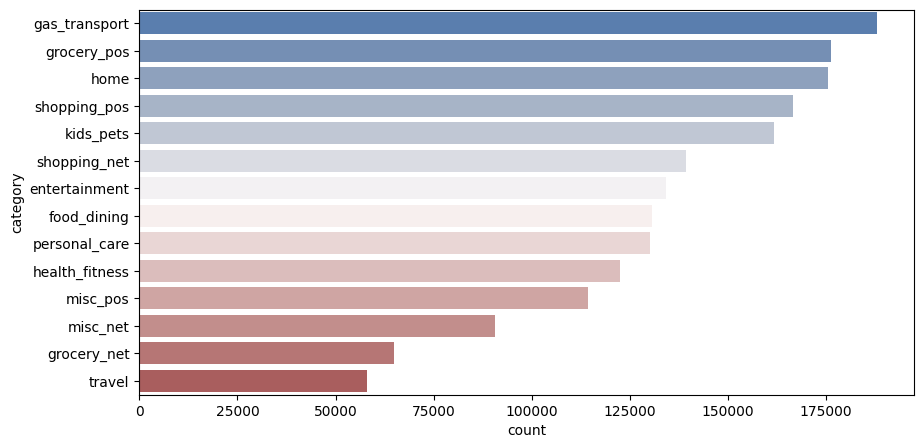

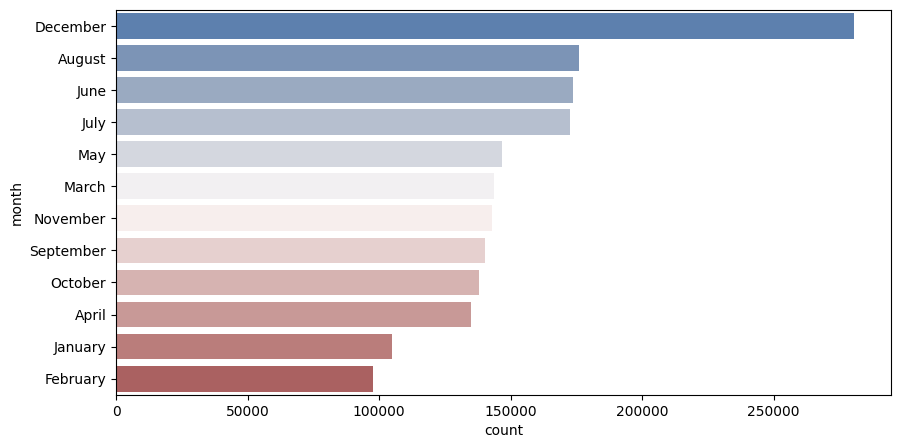

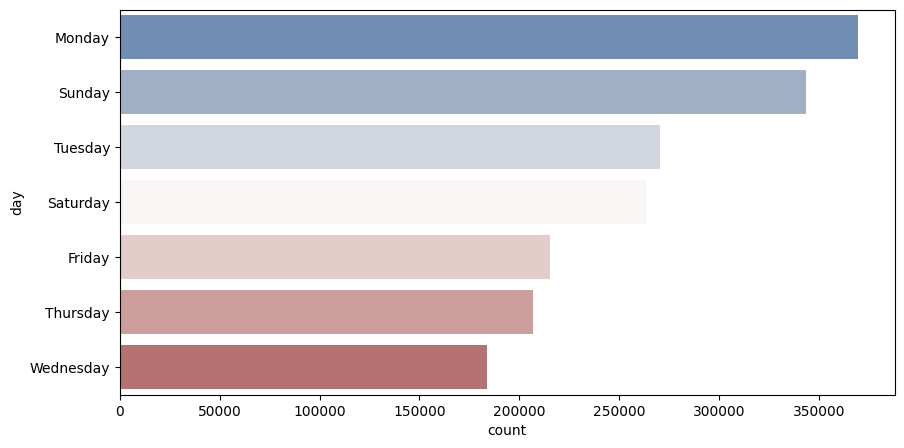

In [ ]:
for i in cat_features:
  fig, ax = plt.subplots(1,1, figsize=(10,5))
  sns.countplot(y=fraud[i][1:], data=fraud.iloc[1:], order=fraud[i][1:].value_counts().index, palette='vlag')
  plt.yticks(fontsize=10)
  plt.xticks(fontsize=10)
plt.show()

Analyzing a few of the other categorical variables, we see that for the category of transaction, most of the individuals used their credit cards for gas and transportation, followed by groceries and home. As discussed earlier, most transactions were performed during the month of December and on a Monday.

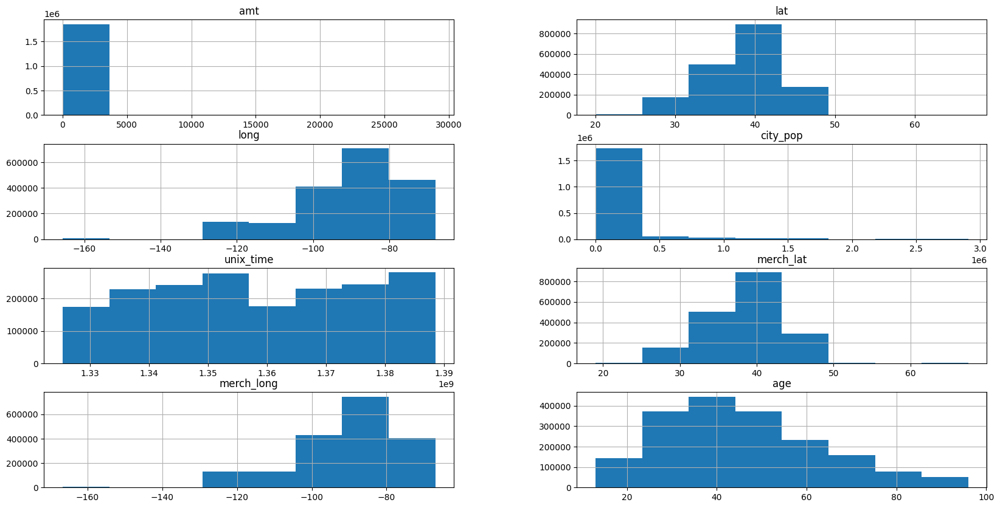

In [ ]:
fig, ax = plt.subplots(4,2, figsize=(20,10))
for ax, c in zip(ax.flatten(), num_features):
  fraud.hist(column=c, ax=ax, bins=8)
plt.show()

Examining the distributions of the numeric attributes through a histogram, what can generalized is that most of the features are skewed. For both longitude and latitude of the transactions, they are each skewed in opposite in directions, latitude being right-skewed and longitude being left skewed and exactly the same interpretation can be made for merchant latitude and longitude. Unix_time on the other hand is the only numerical feature where there exists no skew. For age, it can be inferred that a large number of the individuals in the data are between the ages of 20 and 40 years old and looking at its distribution, it is right skewed. The distribution for amt (amount) and city_pop is not clear in this group plot therefore, plotting each of these in terms of logs will be required.

[]

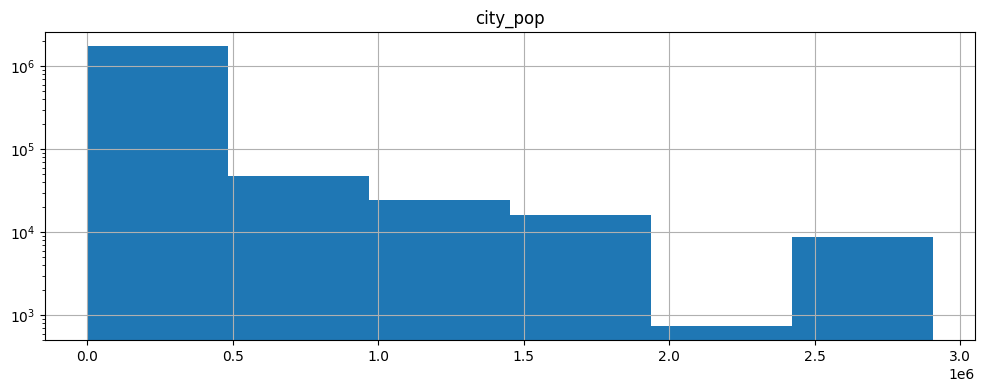

In [ ]:
fraud.hist(column=['city_pop'], figsize=(12,4), bins=6)
plt.semilogy()

[]

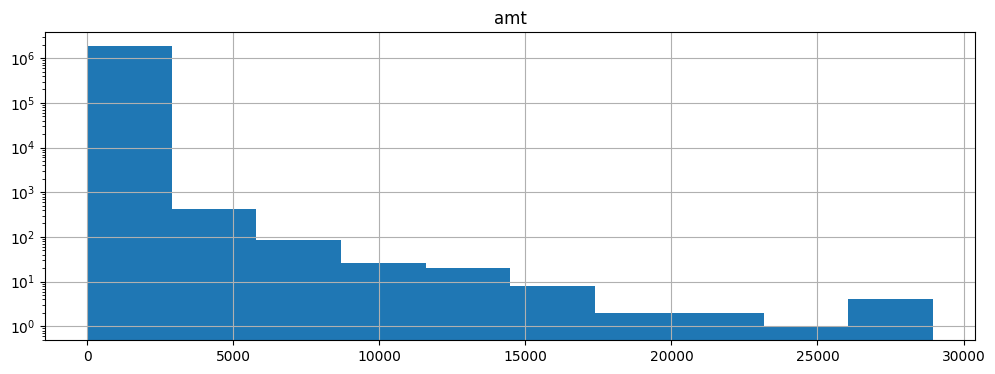

In [ ]:
fraud.hist(column=['amt'], figsize=(12,4))
plt.semilogy()

Getting a better visualiztion of the distribution of city_pop and amt, we can see that each of their distributions are right skewed.

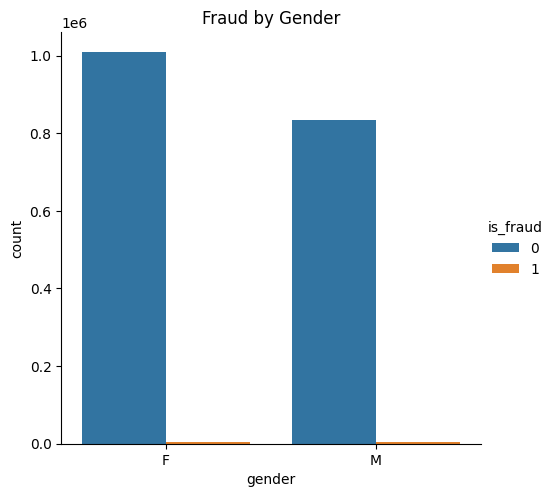

In [ ]:
sns.catplot(
    data = fraud, x='gender', hue='is_fraud', kind='count'
).set(title='Fraud by Gender')

In the barplot above, both males and females in the data for the most part have not made fraudulent transactions. However, there appeares to be a few observations that are fraudulent for both genders though its not easlity visible on this graph.

In [ ]:
fraud.groupby(fraud['gender'])['is_fraud'].value_counts()

gender  is_fraud
F       0           1009850
        1              4899
M       0            832893
        1              4752
Name: is_fraud, dtype: int64

Taking a closer look, though the frequency is pretty small in comparison to non-fraud, females are making more fraud transactions than males however, the difference between the two genders is not large.

Text(0.5, 1.0, 'Fraud by Age Group')

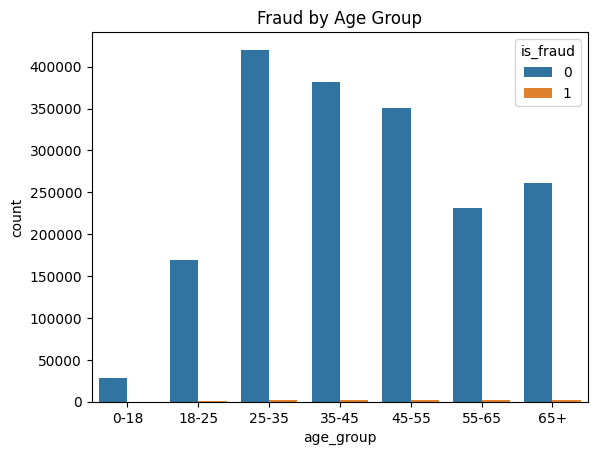

In [ ]:
fraud['age_group'] = pd.cut(fraud.age, bins=[0,18,25,35,45,55,65,float('inf')], right=True, labels=['0-18', '18-25', '25-35', '35-45', '45-55', '55-65', '65+'])
sns.countplot(data=fraud, x='age_group', hue='is_fraud').set_title('Fraud by Age Group')

In [ ]:
fraud.groupby(fraud['age_group'])['is_fraud'].value_counts()

age_group  is_fraud
0-18       0            27753
           1              149
18-25      0           169647
           1              951
25-35      0           420229
           1             1830
35-45      0           381961
           1             1522
45-55      0           350912
           1             1850
55-65      0           231492
           1             1585
65+        0           260749
           1             1764
Name: is_fraud, dtype: int64

With respect to age range of credit card holders involved in fraudulent transactions, people between the ages 45-55 had the highest occurence of fraud, followed by individuals between the ages 25-35, 65+, 55-65, and 35-45 years of age.

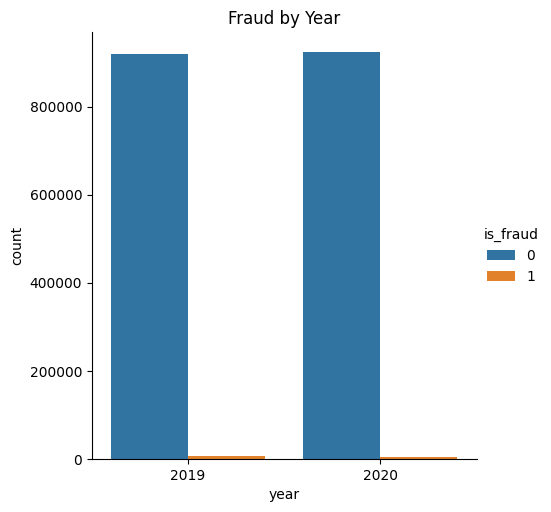

In [ ]:
sns.catplot(
    data = fraud, x='year',hue='is_fraud', kind='count'
).set(title='Fraud by Year')

In [ ]:
fraud.groupby(fraud['year'])['is_fraud'].value_counts()

year  is_fraud
2019  0           919630
      1             5220
2020  0           923113
      1             4431
Name: is_fraud, dtype: int64

Similar to fraud by gender, most individuals did not perform fraudulent transactions for both years. However, taking a further look, more fraudulent transactions were performed in 2019 than in 2020.

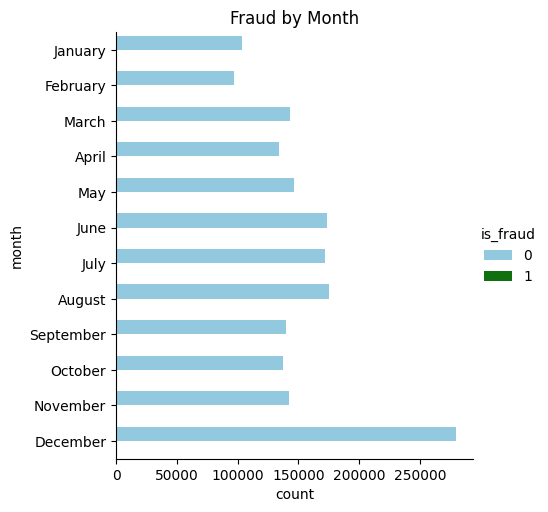

In [ ]:
sns.catplot(
    data = fraud,y='month',hue='is_fraud', kind='count', palette=sns.color_palette(['skyblue', 'green'])
).set(title='Fraud by Month')
plt.rcParams['figure.figsize']=(10,20)

In [ ]:
fraud.groupby(fraud['month'])['is_fraud'].value_counts()

month      is_fraud
April      0           134292
           1              678
August     0           175321
           1              797
December   0           279748
           1              850
February   0            96804
           1              853
January    0           103878
           1              849
July       0           171792
           1              652
June       0           173048
           1              821
March      0           142851
           1              938
May        0           145940
           1              935
November   0           142374
           1              682
October    0           137268
           1              838
September  0           139427
           1              758
Name: is_fraud, dtype: int64

Though the barplot above shows that no fraudulent transaction were made for each month, when breaking it down, the above output shows that the month of March had the highest number of fraudulent transactions in comparison to all the months, followed by May, Feburary, December, and January.

[Text(0.5, 1.0, 'Fraud by State')]

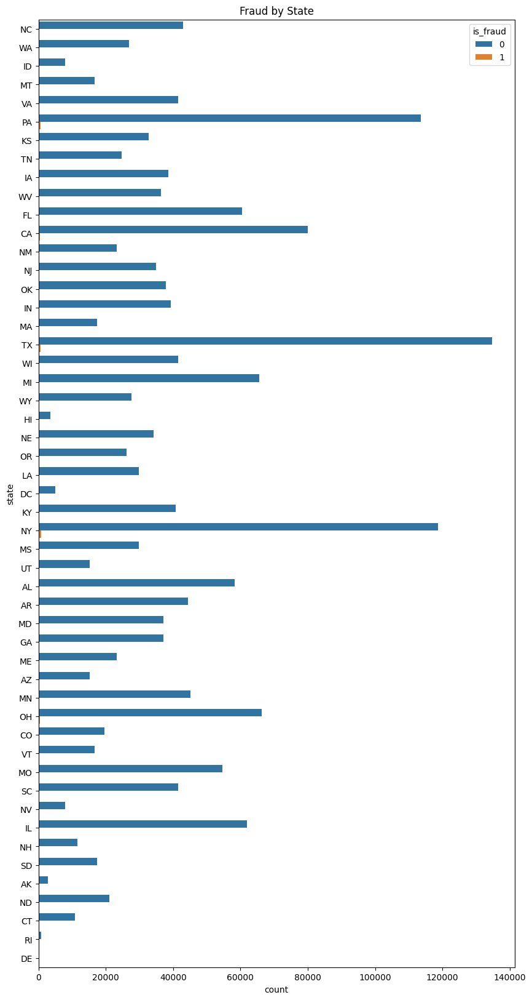

In [ ]:
sns.countplot(data=fraud, y='state', hue='is_fraud').set(title='Fraud by State')

In [ ]:
fraud.groupby(fraud['is_fraud'])['state'].value_counts()

is_fraud  state
0         TX       134677
          NY       118689
          PA       113601
          CA        80093
          OH        66267
                    ...  
1         ID           33
          DC           31
          HI           16
          RI           15
          DE            9
Name: state, Length: 101, dtype: int64

In the barplot, it can be observed that there are a few states that visbly show that fraudulent transaction have occured in those states, namely New York State (NY), Pennsylvania (PA), Virginia (VA), Texas (TX) and others.   Again, like with the previous analysis, most of the transactions in each of the states were not fraudulent.

[Text(0.5, 1.0, 'Fraud by Category')]

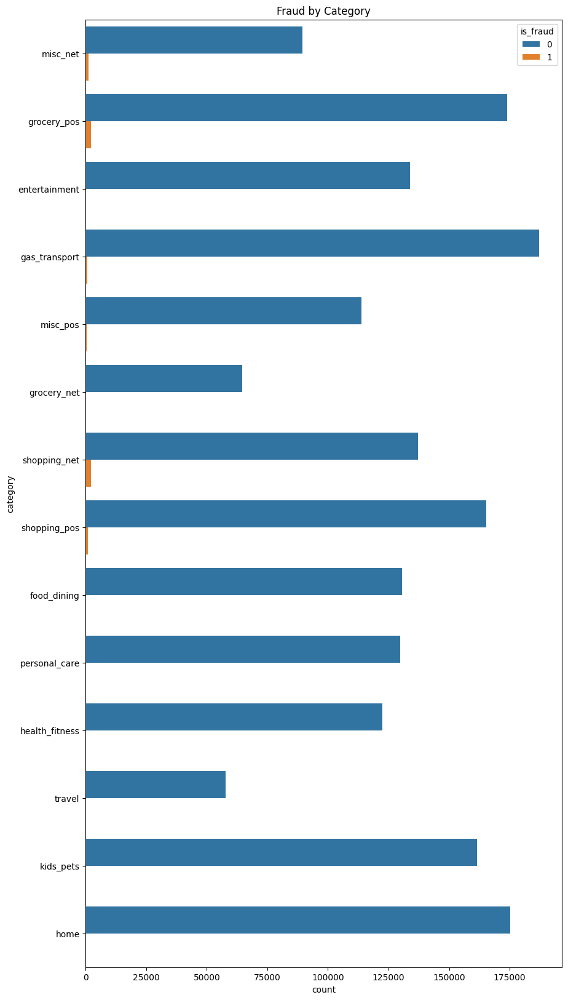

In [ ]:
sns.countplot(data=fraud, y='category', hue='is_fraud').set(title='Fraud by Category')

The countplot above shows that out of all the categories people made transactions on, shopping, miscellaneous, and gas and transportation appeared to have higher counts of fraud as opposed to the remaining categories.

In [ ]:
fraud = fraud.drop('age_group', axis=1)

Since there are 2 age variables, I removed age_group since it will no longer be needed for the remainder of the analysis

In [ ]:
#pip install pandas-profiling

In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(fraud)

<ipython-input-51-65f5ce699e0f>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The Pandas profile report above summarizes the dataset and some of the analysis I have conducted.

***Data Cleaning (returned)***

In [ ]:
fraud = fraud.drop(['cc_num', 'first', 'last', 'zip', 'trans_num', 'unix_time'], axis = 1)

After getting a better understanding of the dataset, it was realized that some of these variables do not contain valuable information in regards to understanding what is considered a fraudulent transaction. Namely, these are cc_num, first, last, zip, trans_num, and unix_time. For cc_num and zip, they both have 1 unique value, meaning that each of the transactions have the same value, hence not contributing useful information when creating the models. As well, first and last name of the credit card holder is considered confidential and therefore would need to be reomoved from the dataset.

Transforming categorical features

In [ ]:
keep_city = fraud['city'].value_counts().index[:10]
fraud['city'] = np.where(fraud['city'].isin(keep_city), fraud['city'], 'Other' )

fraud['city'].value_counts()

Other          1782981
Birmingham        8040
San Antonio       7312
Utica             7309
Phoenix           7297
Meridian          7289
Warren            6584
Conway            6574
Cleveland         6572
Thomas            6571
Houston           5865
Name: city, dtype: int64

In [ ]:
keep_state = fraud['state'].value_counts().index[:10]
fraud['state'] = np.where(fraud['state'].isin(keep_state), fraud['state'], 'Other')

# fraud['state'].value_counts()

In [ ]:
keep_job = fraud['job'].value_counts().index[:10]
fraud['job'] = np.where(fraud['job'].isin(keep_job), fraud['job'], 'Other')

#fraud['job'].value_counts()

In [ ]:
keep_merchant = fraud['merchant'].value_counts().index[:10]
fraud['merchant'] = np.where(fraud['merchant'].isin(keep_merchant), fraud['merchant'], 'Other')

#fraud['merchant'].value_counts()

In [ ]:
keep_street = fraud['street'].value_counts().index[:10]
fraud['street'] = np.where(fraud['street'].isin(keep_street), fraud['street'], 'Other')

#fraud['street'].value_counts()

As mentioned earlier, each of these categorical features contain a high number of unique values in which when we one - hot enode them, the dataset will become increasingly large. Hence, to prevent this, these variables will be transformed to keep the top 10 levels based on their frequency and will assign the remaining levels to a level called "Other".

In [ ]:
# Converting gender and year variable to their binary values
for col in ['gender', 'year']:
    fraud[col] = fraud[col].astype('category')
    fraud[col] = fraud[col].cat.codes

Here, 0 for the gender variable is female and 1 being male whereas for year, 0 represents 2019 and 1 being 2020.

Dealing with outliers

In [ ]:
# Copying the original dataset
fraud_copy = fraud.copy()

In [ ]:
# Transforming outliers using iqr method
trans = RobustScaler()
fraud_trans = fraud
fraud_trans[['amt', 'lat', 'long', 'city_pop', 'merch_lat', 'merch_long', 'age']] = trans.fit_transform(fraud[['amt', 'lat', 'long', 'city_pop', 'merch_lat', 'merch_long', 'age']])

In [ ]:
fraud_trans.describe()

,amt,gender,lat,long,city_pop,merch_lat,merch_long,is_fraud,year,age
count,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06
mean,3.078351e-01,4.521959e-01,-1.120799e-01,-1.653205e-01,4.400913e+00,-1.150095e-01,-1.673586e-01,5.210015e-03,5.007272e-01,7.187585e-02
std,2.167901e+00,4.977097e-01,6.974449e-01,8.261956e-01,1.539223e+01,7.075255e-01,8.261930e-01,7.199217e-02,4.999996e-01,6.969570e-01
min,-6.323169e-01,0.000000e+00,-2.657939e+00,-4.699243e+00,-1.235513e-01,-2.818886e+00,-4.757374e+00,0.000000e+00,0.000000e+00,-1.240000e+00
25%,-5.147019e-01,0.000000e+00,-6.443512e-01,-5.601623e-01,-8.689437e-02,-6.414479e-01,-5.679451e-01,0.000000e+00,0.000000e+00,-4.800000e-01
50%,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.923288e-16,4.266414e-16,0.000000e+00,1.000000e+00,0.000000e+00
75%,4.852981e-01,1.000000e+00,3.556488e-01,4.398377e-01,9.131056e-01,3.585521e-01,4.320549e-01,0.000000e+00,1.000000e+00,5.200000e-01
max,3.934311e+02,1.000000e+00,3.759747e+00,1.173474e+00,1.482747e+02,3.899781e+00,1.230298e+00,1.000000e+00,1.000000e+00,2.080000e+00


Data without outliers

In [ ]:
def outliers(df, feature):
  Q1 = df[feature].quantile(0.25)
  Q3 = df[feature].quantile(0.75)
  IQR = Q3 - Q1

  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR

  ls = df.index[(df[feature] < lower_bound) | (df[feature] > upper_bound)] # stores indexes of outliers

  return ls

In [ ]:
index_list = []
for feat in ['amt', 'lat', 'long', 'city_pop', 'merch_lat', 'merch_long', 'age']:
  index_list.extend(outliers(fraud_copy, feat))

In [ ]:
def remove(df, ls):
  ls = sorted(set(ls))
  df = df.drop(ls)
  return df

In [ ]:
fraud_no_outliers = remove(fraud_copy, index_list)
fraud_no_outliers.shape[0]

1174016

In [ ]:
# Scaling the data using MinMax
scaler = MinMaxScaler()
fraud_no_outliers[['amt', 'lat', 'long', 'city_pop', 'merch_lat', 'merch_long', 'age']] = scaler.fit_transform(fraud_no_outliers[['amt', 'lat', 'long', 'city_pop', 'merch_lat', 'merch_long', 'age']])

In [ ]:
fraud_no_outliers.describe() # Check

,amt,gender,lat,long,city_pop,merch_lat,merch_long,is_fraud,year,age
count,1.174016e+06,1.174016e+06,1.174016e+06,1.174016e+06,1.174016e+06,1.174016e+06,1.174016e+06,1.174016e+06,1.174016e+06,1.174016e+06
mean,2.602895e-01,4.579520e-01,5.928507e-01,6.141770e-01,1.064837e-01,5.816226e-01,6.090959e-01,1.356029e-03,5.010366e-01,4.123622e-01
std,2.268896e-01,4.982290e-01,1.896967e-01,2.156431e-01,1.850823e-01,1.783949e-01,2.085860e-01,3.679934e-02,4.999991e-01,2.176340e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,4.326798e-02,0.000000e+00,4.601954e-01,4.788225e-01,1.158373e-02,4.502774e-01,4.759202e-01,0.000000e+00,0.000000e+00,2.345679e-01
50%,2.293931e-01,0.000000e+00,6.241968e-01,6.444941e-01,3.400386e-02,6.097821e-01,6.348946e-01,0.000000e+00,1.000000e+00,3.827160e-01
75%,3.967445e-01,1.000000e+00,7.234000e-01,7.778613e-01,1.011397e-01,7.025831e-01,7.701973e-01,0.000000e+00,1.000000e+00,5.555556e-01
max,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


One-hot-encoding categorical features (**dataset with transformed outliers**)

In [ ]:
cat_columns = ['merchant', 'category', 'street', 'city', 'state', 'job', 'month', 'day']

In [ ]:
fraud_trans = pd.get_dummies(fraud_trans, columns = cat_columns, prefix = cat_columns)
fraud_trans.head(5)

,amt,gender,lat,long,city_pop,merch_lat,merch_long,is_fraud,year,age,...,month_November,month_October,month_September,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
0,-0.578274,0,-0.450457,0.378534,0.053709,-0.465291,0.323782,0,0,-0.56,...,0,0,0,0,0,0,0,0,1,0
1,0.813776,0,1.311077,-1.846971,-0.117118,1.356701,-1.846112,0,0,-0.16,...,0,0,0,0,0,0,0,0,1,0
2,2.350395,1,0.388709,-1.489489,0.087354,0.524076,-1.483925,0,0,0.48,...,0,0,0,0,0,0,0,0,1,0
3,-0.033351,1,0.945651,-1.480583,-0.025731,1.062262,-1.508339,0,0,0.32,...,0,0,0,0,0,0,0,0,1,0
4,-0.074735,1,-0.128392,0.481611,-0.119671,-0.096160,0.528885,0,0,-0.48,...,0,0,0,0,0,0,0,0,1,0


One-hot-encoding categorical features (**dataset without outliers**)

In [ ]:
fraud_no_outliers = pd.get_dummies(fraud_no_outliers, columns = cat_columns, prefix = cat_columns)
fraud_no_outliers.head(5)

,amt,gender,lat,long,city_pop,merch_lat,merch_long,is_fraud,year,age,...,month_November,month_October,month_September,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
1,0.552447,0,1.000000,0.052785,0.002616,0.971950,0.067213,0,0,0.333333,...,0,0,0,0,0,0,0,0,1,0
4,0.213012,1,0.568048,0.783031,0.001578,0.568266,0.787327,0,0,0.234568,...,0,0,0,0,0,0,0,0,1,0
5,0.486921,0,0.648697,0.863286,0.044321,0.644443,0.832474,0,0,0.543210,...,0,0,0,0,0,0,0,0,1,0
7,0.367414,1,0.585484,0.799288,0.124452,0.578781,0.789005,0,0,0.716049,...,0,0,0,0,0,0,0,0,1,0
8,0.017006,0,0.647084,0.779303,0.030080,0.632831,0.763192,0,0,0.790123,...,0,0,0,0,0,0,0,0,1,0


Feature Selection

In [ ]:
skf = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 300)

In [ ]:
y1 = fraud_trans.is_fraud

In [ ]:
col = 'is_fraud'
X1 = fraud_trans.loc[:, fraud_trans.columns != col]

In [ ]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size = 0.3, random_state = 300)

In [ ]:
feat_select = RFECV(tree.DecisionTreeClassifier(random_state = 300), cv = skf, scoring = 'f1')
feat_select = feat_select.fit(X1_train, y1_train)

print('Number of features: ', feat_select.n_features_)
print('Best features: ', X1_train.columns[feat_select.support_])

Number of features:  55
Best features:  Index(['amt', 'gender', 'lat', 'long', 'city_pop', 'merch_lat', 'merch_long',
       'year', 'age', 'merchant_Other', 'category_entertainment',
       'category_gas_transport', 'category_grocery_net',
       'category_grocery_pos', 'category_home', 'category_misc_net',
       'category_misc_pos', 'category_shopping_net', 'category_shopping_pos',
       'category_travel', 'street_Other', 'state_AL', 'state_CA', 'state_FL',
       'state_IL', 'state_MI', 'state_MO', 'state_NY', 'state_OH',
       'state_Other', 'state_PA', 'state_TX', 'job_Financial adviser',
       'job_Materials engineer', 'job_Other', 'job_Surveyor, land/geomatics',
       'month_April', 'month_August', 'month_December', 'month_February',
       'month_January', 'month_July', 'month_June', 'month_March', 'month_May',
       'month_November', 'month_October', 'month_September', 'day_Friday',
       'day_Monday', 'day_Saturday', 'day_Sunday', 'day_Thursday',
       'day_Tuesday', 

In [ ]:
feat_select.cv_results_['mean_test_score']

array([0.29050237, 0.2602689 , 0.26599245, 0.4453046 , 0.45923073,
       0.47799561, 0.5523994 , 0.55815121, 0.56113118, 0.57805445,
       0.58715344, 0.60200336, 0.61169802, 0.61695609, 0.61580787,
       0.62479095, 0.62437999, 0.62379311, 0.62607856, 0.62488204,
       0.62739385, 0.62574225, 0.63258578, 0.6324782 , 0.6374693 ,
       0.63027588, 0.63807035, 0.63605489, 0.6407165 , 0.6399566 ,
       0.64242989, 0.64297837, 0.64788012, 0.65415038, 0.6568965 ,
       0.65478911, 0.66071656, 0.66028158, 0.66001439, 0.66195657,
       0.66073433, 0.66123148, 0.66439494, 0.66335873, 0.66246569,
       0.66080394, 0.66318493, 0.66004597, 0.66080234, 0.65857203,
       0.65947037, 0.66685346, 0.67047059, 0.67023046, 0.67203519,
       0.66798853, 0.66676495, 0.66537714, 0.66513336, 0.66817002,
       0.66684808, 0.66645375, 0.66641647, 0.66975094, 0.66758098,
       0.66809406, 0.66781533, 0.66631764, 0.66987904, 0.66387939,
       0.67001278, 0.66839828, 0.66744199, 0.66673894, 0.66735

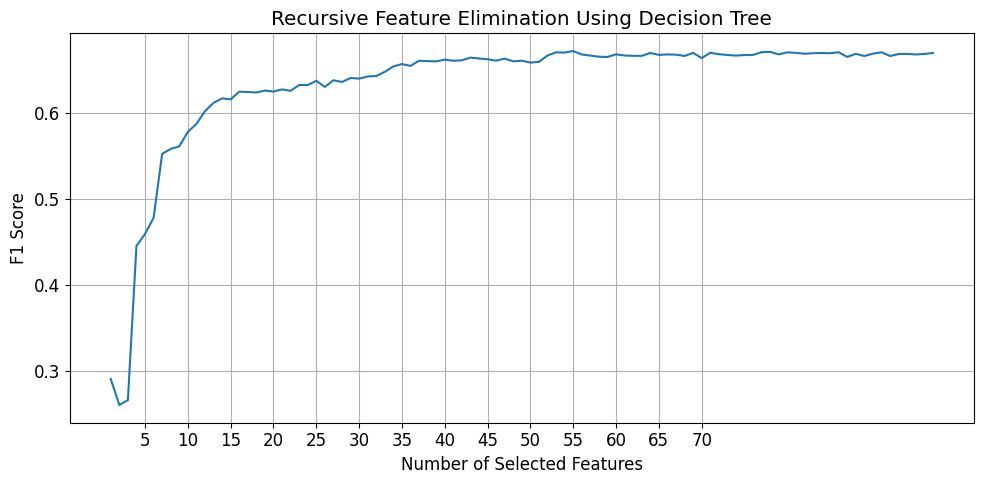

In [ ]:
plt.figure(figsize=(10,5))
plt.rcParams.update({'font.size': 12})

plt.plot(range(1, len(feat_select.cv_results_['mean_test_score']) + 1), feat_select.cv_results_['mean_test_score'])
x_ticks = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70]
plt.xticks(ticks = x_ticks)
plt.xlabel('Number of Selected Features')
plt.ylabel('F1 Score')
plt.title('Recursive Feature Elimination Using Decision Tree')

plt.grid()
plt.tight_layout()

Subset of Original Dataset with Selected Features

In [ ]:
fraud_trans_SelectFeat = fraud_trans[['is_fraud','amt', 'gender', 'lat', 'long', 'city_pop', 'merch_lat', 'merch_long',
       'year', 'age', 'merchant_Other', 'category_entertainment',
       'category_gas_transport', 'category_grocery_net',
       'category_grocery_pos', 'category_home', 'category_misc_net',
       'category_misc_pos', 'category_shopping_net', 'category_shopping_pos',
       'category_travel', 'street_Other', 'state_AL', 'state_CA', 'state_FL',
       'state_IL', 'state_MI', 'state_MO', 'state_NY', 'state_OH',
       'state_Other', 'state_PA', 'state_TX', 'job_Financial adviser',
       'job_Materials engineer', 'job_Other', 'job_Surveyor, land/geomatics',
       'month_April', 'month_August', 'month_December', 'month_February',
       'month_January', 'month_July', 'month_June', 'month_March', 'month_May',
       'month_November', 'month_October', 'month_September', 'day_Friday',
       'day_Monday', 'day_Saturday', 'day_Sunday', 'day_Thursday',
       'day_Tuesday', 'day_Wednesday']]

Subset of Copied Dataset Containing No Outliers with Selected Features  

In [ ]:
fraud_no_outliers_SelectFeat = fraud_no_outliers[['is_fraud','amt', 'gender', 'lat', 'long', 'city_pop', 'merch_lat', 'merch_long',
       'year', 'age', 'merchant_Other', 'category_entertainment',
       'category_gas_transport', 'category_grocery_net',
       'category_grocery_pos', 'category_home', 'category_misc_net',
       'category_misc_pos', 'category_shopping_net', 'category_shopping_pos',
       'category_travel', 'street_Other', 'state_AL', 'state_CA', 'state_FL',
       'state_IL', 'state_MI', 'state_MO', 'state_NY', 'state_OH',
       'state_Other', 'state_PA', 'state_TX', 'job_Financial adviser',
       'job_Materials engineer', 'job_Other', 'job_Surveyor, land/geomatics',
       'month_April', 'month_August', 'month_December', 'month_February',
       'month_January', 'month_July', 'month_June', 'month_March', 'month_May',
       'month_November', 'month_October', 'month_September', 'day_Friday',
       'day_Monday', 'day_Saturday', 'day_Sunday', 'day_Thursday',
       'day_Tuesday', 'day_Wednesday']]

**Preparing and Modelling Data**

**A) Original Dataset**

In [ ]:
y1 = fraud_trans.is_fraud

In [ ]:
col = 'is_fraud'
X1 = fraud_trans.loc[:, fraud_trans.columns != col]

In [ ]:
skf = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 300)

In [ ]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size = 0.3, random_state = 300)

1. Under Sampling

Logistic Regression

In [ ]:
rus_log_pipeline = imbpipeline(steps = [['RandomUnderSampler', RandomUnderSampler(sampling_strategy = 'majority',random_state = 300)],
                                      ['LogisticRegression', LogisticRegression(random_state = 300)]])

In [ ]:
log_param = {
    'LogisticRegression__C': [1.0, 0.1, 0.01, 0.001]
}
log_grid_rus = RandomizedSearchCV(rus_log_pipeline, param_distributions = log_param, n_iter = 5 , cv = skf, scoring = 'precision', return_train_score = True)


In [ ]:
start_time = time.time()
log_grid_rus = log_grid_rus.fit(X1_train, y1_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

In [ ]:
log_grid_rus.best_estimator_

Pipeline(steps=[('RandomUnderSampler',
                 RandomUnderSampler(random_state=300,
                                    sampling_strategy='majority')),
                ['LogisticRegression',
                 LogisticRegression(C=0.001, random_state=300)]])

In [ ]:
y_pred_logrus = log_grid_rus.best_estimator_.predict(X1_test)

In [ ]:
matthews_corrcoef(y1_test, y_pred_logrus)

0.2514222942022878

In [ ]:
f1_score(y1_test, y_pred_logrus)

0.16071822797851204

Let the **Positive class = "Fraudulent"** (is_fraud = 1) and **Negative Class = "Legitimate"** (is_fraud = 0)

In [ ]:
confusion = confusion_matrix(y1_test, y_pred_logrus)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[530725  22095]
 [   715   2184]]
TP:  2184 , FP:  22095 , TN:  530725 , FN: 715


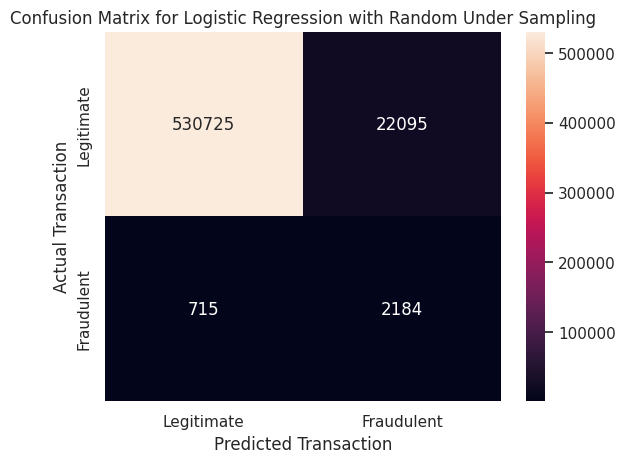

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Logistic Regression with Random Under Sampling')
plt.show()

Decision Tree

In [ ]:
rus_tree_pipeline = imbpipeline(steps = [['RandomUnderSampler', RandomUnderSampler(sampling_strategy = 'majority',random_state = 300)],
                                      ['DecisionTree', tree.DecisionTreeClassifier(random_state = 300)]])

In [ ]:
tree_param = {
    'DecisionTree__criterion': ['gini', 'entropy'],
    'DecisionTree__max_depth': [5, 10, 20, 25]
}
tree_grid_rus = RandomizedSearchCV(rus_tree_pipeline, param_distributions = tree_param, n_iter = 5, cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
tree_grid_rus = tree_grid_rus.fit(X1_train, y1_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:01:14


In [ ]:
tree_grid_rus.best_estimator_

Pipeline(steps=[('RandomUnderSampler',
                 RandomUnderSampler(random_state=300,
                                    sampling_strategy='majority')),
                ['DecisionTree',
                 DecisionTreeClassifier(criterion='entropy', max_depth=25,
                                        random_state=300)]])

In [ ]:
y_pred_treerus = tree_grid_rus.best_estimator_.predict(X1_test)

In [ ]:
matthews_corrcoef(y1_test, y_pred_treerus)

0.31862468745532424

In [ ]:
f1_score(y1_test, y_pred_treerus)

0.19810985575214948

In [ ]:
confusion = confusion_matrix(y1_test, y_pred_treerus)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[530361  22459]
 [   111   2788]]
TP:  2788 , FP:  22459 , TN:  530361 , FN: 111


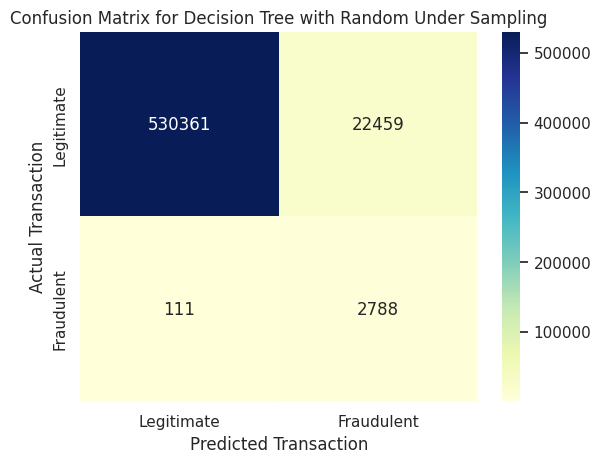

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'YlGnBu')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Decision Tree with Random Under Sampling')
plt.show()

Random Forest

In [ ]:
rus_RanFor_pipeline = imbpipeline(steps = [['RandomUnderSampler', RandomUnderSampler(sampling_strategy = 'majority',random_state = 300)],
                                      ['RandomForest', RandomForestClassifier(random_state = 300)]])

In [ ]:
RanFor_param = {
    'RandomForest__n_estimators': [100, 200],
    'RandomForest__criterion': ['gini', 'entropy'],
    'RandomForest__max_depth': [5, 10, 20, 25]
}
RanFor_grid_rus = RandomizedSearchCV(rus_RanFor_pipeline, param_distributions = RanFor_param, n_iter = 5 ,cv = skf, scoring = 'precision', return_train_score = True  )

In [ ]:
start_time = time.time()
RanFor_grid_rus = RanFor_grid_rus.fit(X1_train, y1_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:15:20


In [ ]:
RanFor_grid_rus.best_estimator_

Pipeline(steps=[('RandomUnderSampler',
                 RandomUnderSampler(random_state=300,
                                    sampling_strategy='majority')),
                ['RandomForest',
                 RandomForestClassifier(criterion='entropy', max_depth=25,
                                        n_estimators=200, random_state=300)]])

In [ ]:
y_pred_RFrus = RanFor_grid_rus.best_estimator_.predict(X1_test)

In [ ]:
matthews_corrcoef(y1_test, y_pred_RFrus)

0.4373484890229843

In [ ]:
f1_score(y1_test, y_pred_RFrus)

0.34207698628405286

In [ ]:
confusion = confusion_matrix(y1_test, y_pred_RFrus)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[542604  10216]
 [   193   2706]]
TP:  2706 , FP:  10216 , TN:  542604 , FN: 193


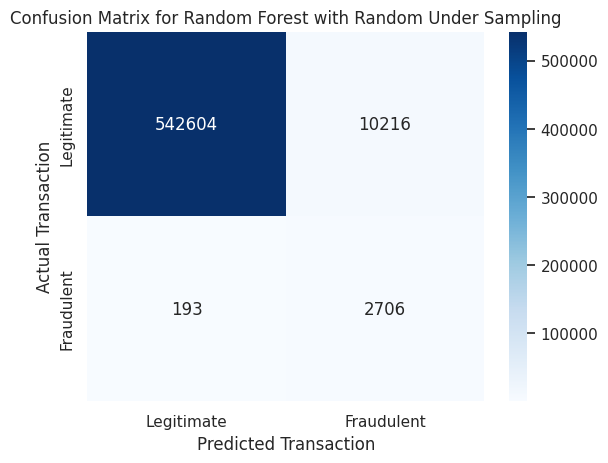

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'Blues')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Random Forest with Random Under Sampling')
plt.show()

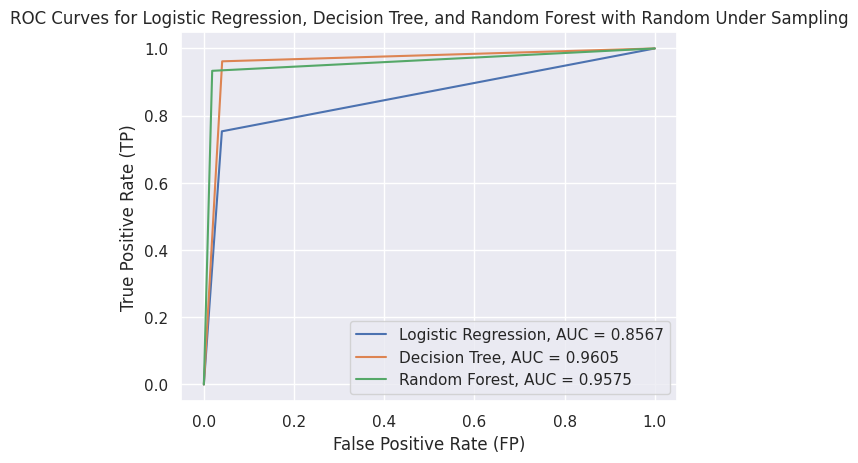

In [ ]:
plt.figure(0).clf()
fp, tp,_ = roc_curve(y1_test, y_pred_logrus)
auc = round(roc_auc_score(y1_test, y_pred_logrus), 4)
plt.plot(fp, tp, label = 'Logistic Regression, AUC = '+str(auc))

fp, tp,_ = roc_curve(y1_test, y_pred_treerus)
auc = round(roc_auc_score(y1_test, y_pred_treerus), 4)
plt.plot(fp, tp, label = 'Decision Tree, AUC = '+str(auc))

fp, tp,_ = roc_curve(y1_test, y_pred_RFrus)
auc = round(roc_auc_score(y1_test, y_pred_RFrus), 4)
plt.plot(fp, tp, label = 'Random Forest, AUC = '+str(auc))

plt.title('ROC Curves for Logistic Regression, Decision Tree, and Random Forest with Random Under Sampling')
plt.ylabel('True Positive Rate (TP)')
plt.xlabel('False Positive Rate (FP)')
plt.legend()

2. Over Sampling

Logistic Regression

In [ ]:
ros_log_pipeline = imbpipeline(steps = [['RandomOverSampler', RandomOverSampler(sampling_strategy = 'minority',random_state = 300)],
                                      ['LogisticRegression', LogisticRegression(random_state = 300)]])

In [ ]:
log_param = {
    'LogisticRegression__C': [1.0, 0.1, 0.01, 0.001]
}
log_grid_ros = RandomizedSearchCV(ros_log_pipeline, param_distributions = log_param, n_iter = 5 , cv = skf, scoring = 'precision', return_train_score = True)


In [ ]:
start_time = time.time()
log_grid_ros = log_grid_ros.fit(X1_train, y1_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

In [ ]:
log_grid_ros.best_estimator_

Pipeline(steps=[('RandomOverSampler',
                 RandomOverSampler(random_state=300,
                                   sampling_strategy='minority')),
                ['LogisticRegression',
                 LogisticRegression(C=0.001, random_state=300)]])

In [ ]:
y_pred_logros = log_grid_ros.best_estimator_.predict(X1_test)

In [ ]:
matthews_corrcoef(y1_test, y_pred_logros)

0.15635666439977436

In [ ]:
f1_score(y1_test, y_pred_logros)

0.07360166924681967

In [ ]:
confusion = confusion_matrix(y1_test, y_pred_logros)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[498478  54342]
 [   712   2187]]
TP:  2187 , FP:  54342 , TN:  498478 , FN: 712


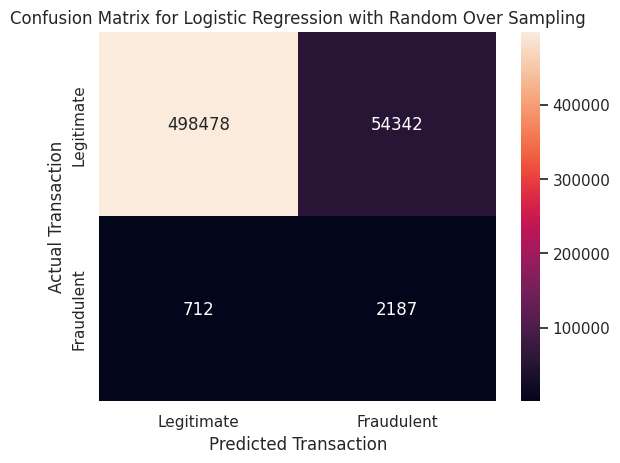

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Logistic Regression with Random Over Sampling')
plt.show()

Decision Tree

In [ ]:
ros_tree_pipeline = imbpipeline(steps = [['RandomOverSampler', RandomOverSampler(sampling_strategy = 'minority',random_state = 300)],
                                      ['DecisionTree', tree.DecisionTreeClassifier(random_state = 300)]])

In [ ]:
tree_param = {
    'DecisionTree__criterion': ['gini', 'entropy'],
    'DecisionTree__max_depth': [5, 10, 20, 25]
}
tree_grid_ros = RandomizedSearchCV(ros_tree_pipeline, param_distributions = tree_param, n_iter = 5, cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
tree_grid_ros = tree_grid_ros.fit(X1_train, y1_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:23:07


In [ ]:
tree_grid_ros.best_estimator_

Pipeline(steps=[('RandomOverSampler',
                 RandomOverSampler(random_state=300,
                                   sampling_strategy='minority')),
                ['DecisionTree',
                 DecisionTreeClassifier(criterion='entropy', max_depth=25,
                                        random_state=300)]])

In [ ]:
y_pred_treeros = tree_grid_ros.best_estimator_.predict(X1_test)

In [ ]:
matthews_corrcoef(y1_test, y_pred_treeros)

0.5010949113943248

In [ ]:
f1_score(y1_test, y_pred_treeros)

0.4572849328692193

In [ ]:
confusion = confusion_matrix(y1_test, y_pred_treeros)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[547963   4857]
 [   600   2299]]
TP:  2299 , FP:  4857 , TN:  547963 , FN: 600


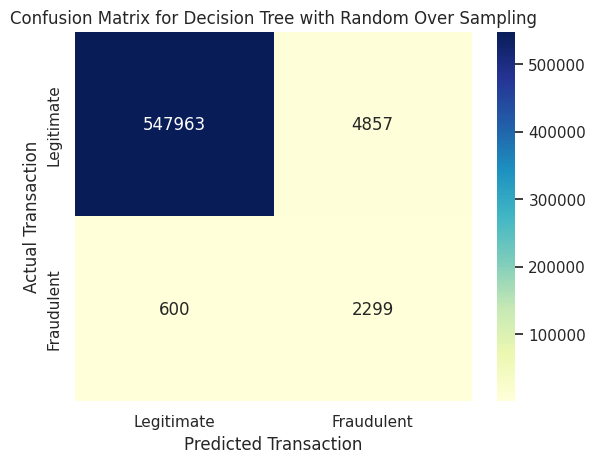

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'YlGnBu')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Decision Tree with Random Over Sampling')
plt.show()

Random Forest

In [ ]:
ros_RanFor_pipeline = imbpipeline(steps = [['RandomOverSampler', RandomOverSampler(sampling_strategy = 'minority',random_state = 300)],
                                      ['RandomForest', RandomForestClassifier(random_state = 300)]])

In [ ]:
RanFor_param = {
    'RandomForest__n_estimators': [100, 200],
    'RandomForest__criterion': ['gini', 'entropy'],
    'RandomForest__max_depth': [5, 10, 20, 25]
}
RanFor_grid_ros = RandomizedSearchCV(ros_RanFor_pipeline, param_distributions = RanFor_param, n_iter = 5 ,cv = skf, scoring = 'precision', return_train_score = True  )

In [ ]:
start_time = time.time()
RanFor_grid_ros = RanFor_grid_ros.fit(X1_train, y1_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 04:19:29


In [ ]:
RanFor_grid_ros.best_estimator_

Pipeline(steps=[('RandomOverSampler',
                 RandomOverSampler(random_state=300,
                                   sampling_strategy='minority')),
                ['RandomForest',
                 RandomForestClassifier(criterion='entropy', max_depth=25,
                                        random_state=300)]])

In [ ]:
y_pred_RFros = RanFor_grid_ros.best_estimator_.predict(X1_test)

In [ ]:
matthews_corrcoef(y1_test, y_pred_RFros)

0.7397717395857449

In [ ]:
f1_score(y1_test, y_pred_RFros)

0.7371181734032705

In [ ]:
confusion = confusion_matrix(y1_test, y_pred_RFros)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[551626   1194]
 [   510   2389]]
TP:  2389 , FP:  1194 , TN:  551626 , FN: 510


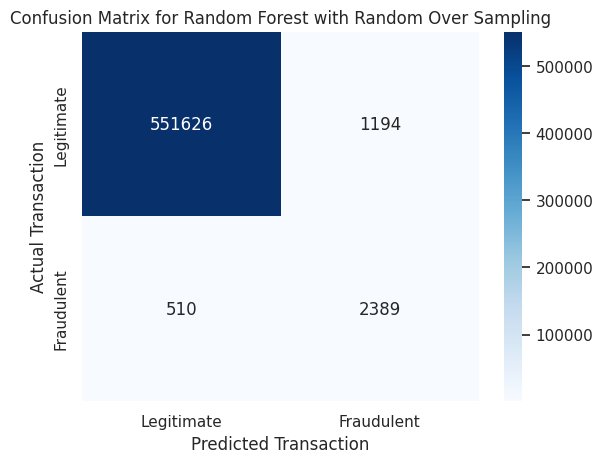

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'Blues')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Random Forest with Random Over Sampling')
plt.show()

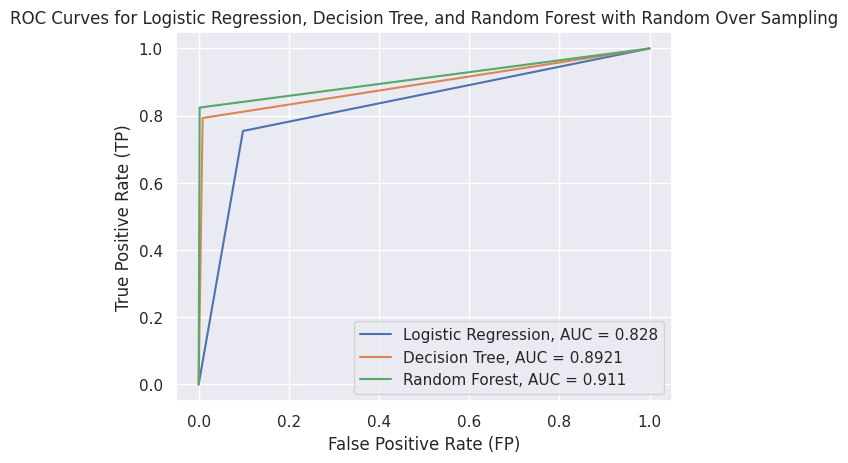

In [ ]:
plt.figure(0).clf()
fp, tp,_ = roc_curve(y1_test, y_pred_logros)
auc = round(roc_auc_score(y1_test, y_pred_logros), 4)
plt.plot(fp, tp, label = 'Logistic Regression, AUC = '+str(auc))

fp, tp,_ = roc_curve(y1_test, y_pred_treeros)
auc = round(roc_auc_score(y1_test, y_pred_treeros), 4)
plt.plot(fp, tp, label = 'Decision Tree, AUC = '+str(auc))

fp, tp,_ = roc_curve(y1_test, y_pred_RFros)
auc = round(roc_auc_score(y1_test, y_pred_RFros), 4)
plt.plot(fp, tp, label = 'Random Forest, AUC = '+str(auc))

plt.title('ROC Curves for Logistic Regression, Decision Tree, and Random Forest with Random Over Sampling')
plt.ylabel('True Positive Rate (TP)')
plt.xlabel('False Positive Rate (FP)')
plt.legend()

3. SMOTE

Logistic Regression

In [ ]:
smote_log_pipeline = imbpipeline(steps = [['SMOTE', SMOTE(random_state = 300)],
                                      ['LogisticRegression', LogisticRegression(random_state = 300)]])

In [ ]:
log_param = {
    'LogisticRegression__C': [1.0, 0.1, 0.01, 0.001]
}
log_grid_smote = RandomizedSearchCV(smote_log_pipeline, param_distributions = log_param, n_iter = 5 , cv = skf, scoring = 'precision', return_train_score = True)


In [ ]:
start_time = time.time()
log_grid_smote = log_grid_smote.fit(X1_train, y1_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

In [ ]:
log_grid_smote.best_estimator_

Pipeline(steps=[('SMOTE', SMOTE(random_state=300)),
                ['LogisticRegression',
                 LogisticRegression(C=0.1, random_state=300)]])

In [ ]:
y_pred_logSmote = log_grid_smote.best_estimator_.predict(X1_test)

In [ ]:
matthews_corrcoef(y1_test, y_pred_logSmote)

0.3722517853849514

In [ ]:
f1_score(y1_test, y_pred_logSmote)

0.31801558276355535

In [ ]:
confusion = confusion_matrix(y1_test, y_pred_logSmote)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[545141   7679]
 [   899   2000]]
TP:  2000 , FP:  7679 , TN:  545141 , FN: 899


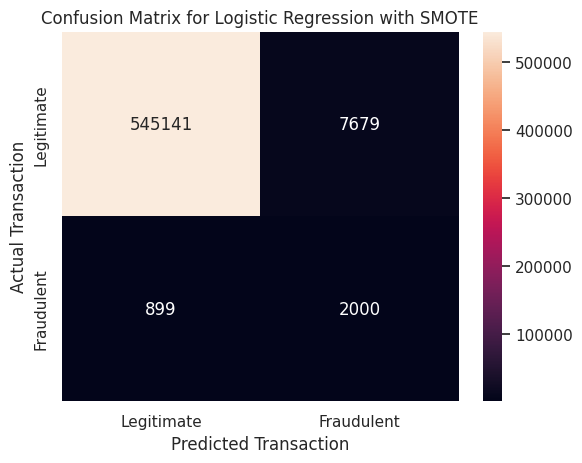

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Logistic Regression with SMOTE')
plt.show()

Decision Tree

In [ ]:
smote_tree_pipeline = imbpipeline(steps = [['SMOTE', SMOTE(random_state = 300)],
                                      ['DecisionTree', tree.DecisionTreeClassifier(random_state = 300)]])

In [ ]:
tree_param = {
    'DecisionTree__criterion': ['gini', 'entropy'],
    'DecisionTree__max_depth': [5, 10, 20, 25]
}
tree_grid_smote = RandomizedSearchCV(smote_tree_pipeline, param_distributions = tree_param, n_iter = 5, cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
tree_grid_smote = tree_grid_smote.fit(X1_train, y1_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:23:08


In [ ]:
tree_grid_smote.best_estimator_

Pipeline(steps=[('SMOTE', SMOTE(random_state=300)),
                ['DecisionTree',
                 DecisionTreeClassifier(max_depth=25, random_state=300)]])

In [ ]:
y_pred_treeSmote = tree_grid_smote.best_estimator_.predict(X1_test)

In [ ]:
matthews_corrcoef(y1_test, y_pred_treeSmote)

0.5163304560870001

In [ ]:
f1_score(y1_test, y_pred_treeSmote)

0.4579210167952791

In [ ]:
confusion = confusion_matrix(y1_test, y_pred_treeSmote)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[547226   5594]
 [   377   2522]]
TP:  2522 , FP:  5594 , TN:  547226 , FN: 377


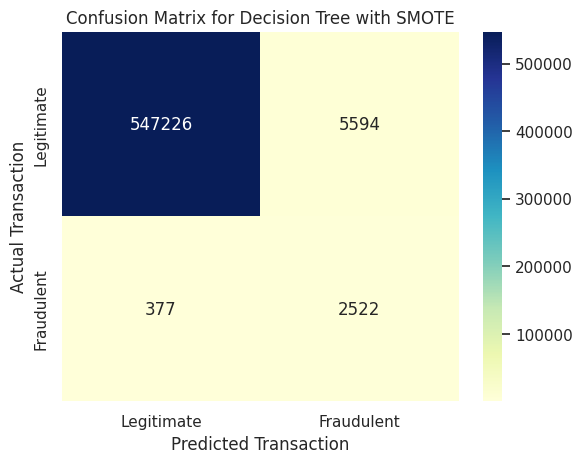

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'YlGnBu')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Decision Tree with SMOTE')
plt.show()

Random Forest

In [ ]:
smote_RanFor_pipeline = imbpipeline(steps = [['SMOTE', SMOTE(random_state = 300)],
                                      ['RandomForest', RandomForestClassifier(random_state = 300)]])

In [ ]:
RanFor_param = {
    'RandomForest__n_estimators': [100, 200],
    'RandomForest__criterion': ['gini', 'entropy'],
    'RandomForest__max_depth': [5, 10, 20, 25]
}
RanFor_grid_smote = RandomizedSearchCV(smote_RanFor_pipeline, param_distributions = RanFor_param, n_iter = 5 ,cv = skf, scoring = 'precision', return_train_score = True  )

In [ ]:
start_time = time.time()
RanFor_grid_smote = RanFor_grid_smote.fit(X1_train, y1_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 04:47:07


In [ ]:
RanFor_grid_smote.best_estimator_

Pipeline(steps=[('SMOTE', SMOTE(random_state=300)),
                ['RandomForest',
                 RandomForestClassifier(criterion='entropy', max_depth=25,
                                        random_state=300)]])

In [ ]:
y_pred_RFSmote = RanFor_grid_smote.best_estimator_.predict(X1_test)

In [ ]:
matthews_corrcoef(y1_test, y_pred_RFSmote)

0.7110695346850747

In [ ]:
f1_score(y1_test, y_pred_RFSmote)

0.7066586682663468

In [ ]:
confusion = confusion_matrix(y1_test, y_pred_RFSmote)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[550838   1982]
 [   491   2408]]
TP:  2408 , FP:  1982 , TN:  550838 , FN: 491


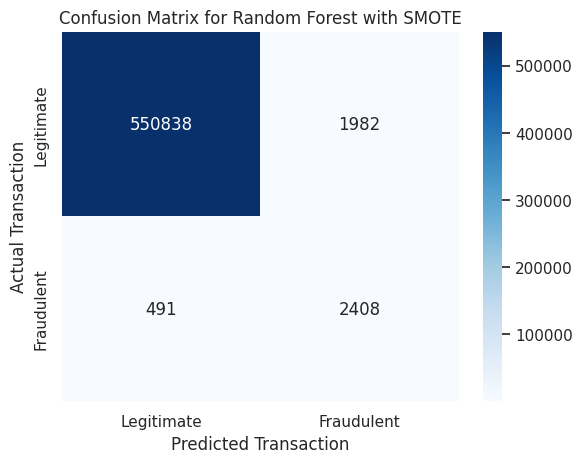

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'Blues')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Random Forest with SMOTE')
plt.show()

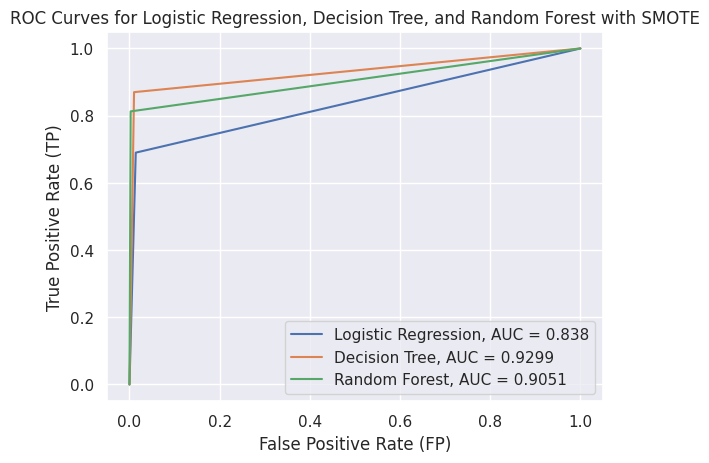

In [ ]:
plt.figure(0).clf()
fp, tp,_ = roc_curve(y1_test, y_pred_logSmote)
auc = round(roc_auc_score(y1_test, y_pred_logSmote), 4)
plt.plot(fp, tp, label = 'Logistic Regression, AUC = '+str(auc))

fp, tp,_ = roc_curve(y1_test, y_pred_treeSmote)
auc = round(roc_auc_score(y1_test, y_pred_treeSmote), 4)
plt.plot(fp, tp, label = 'Decision Tree, AUC = '+str(auc))

fp, tp,_ = roc_curve(y1_test, y_pred_RFSmote)
auc = round(roc_auc_score(y1_test, y_pred_RFSmote), 4)
plt.plot(fp, tp, label = 'Random Forest, AUC = '+str(auc))

plt.title('ROC Curves for Logistic Regression, Decision Tree, and Random Forest with SMOTE')
plt.ylabel('True Positive Rate (TP)')
plt.xlabel('False Positive Rate (FP)')
plt.legend()

**B) Dataset with no outliers**

In [ ]:
y2 = fraud_no_outliers.is_fraud
col = 'is_fraud'
X2 = fraud_no_outliers.loc[:, fraud_no_outliers.columns != col]

In [ ]:
skf = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 300)

In [ ]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size = 0.3, random_state = 300)

1. Under Sampling

Logistic Regression

In [ ]:
rus_log_pipeline = imbpipeline(steps = [['RandomUnderSampler', RandomUnderSampler(sampling_strategy = 'majority',random_state = 300)],
                                      ['LogisticRegression', LogisticRegression(random_state = 300)]])

In [ ]:
log_param = {
    'LogisticRegression__C': [1.0, 0.1, 0.01, 0.001]
}
log_grid_rus_NoOut = RandomizedSearchCV(rus_log_pipeline, param_distributions = log_param, n_iter = 5 , cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
log_grid_rus_NoOut = log_grid_rus_NoOut.fit(X2_train, y2_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

In [ ]:
log_grid_rus_NoOut.best_estimator_

Pipeline(steps=[('RandomUnderSampler',
                 RandomUnderSampler(random_state=300,
                                    sampling_strategy='majority')),
                ['LogisticRegression',
                 LogisticRegression(C=0.001, random_state=300)]])

In [ ]:
y_pred_logrus_NoOut = log_grid_rus_NoOut.best_estimator_.predict(X2_test)

In [ ]:
matthews_corrcoef(y2_test, y_pred_logrus_NoOut)

0.03577489160615491

In [ ]:
f1_score(y2_test, y_pred_logrus_NoOut)

0.006973298079437487

In [ ]:
confusion = confusion_matrix(y2_test, y_pred_logrus_NoOut)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[249314 102394]
 [   137    360]]
TP:  360 , FP:  102394 , TN:  249314 , FN: 137


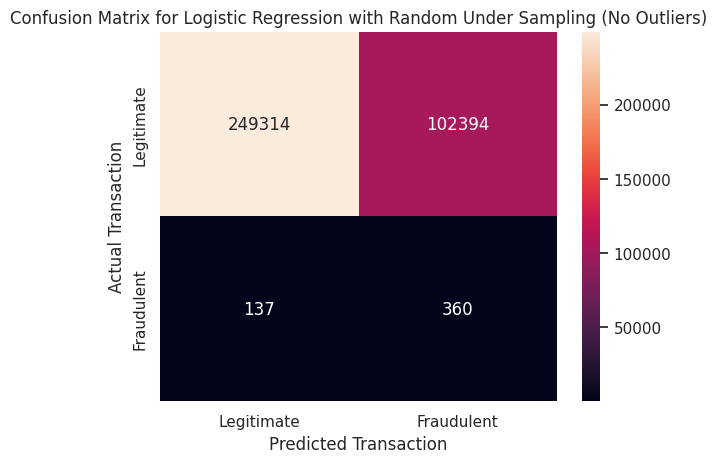

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Logistic Regression with Random Under Sampling (No Outliers)')
plt.show()

Decision Tree

In [ ]:
rus_tree_pipeline = imbpipeline(steps = [['RandomUnderSampler', RandomUnderSampler(sampling_strategy = 'majority',random_state = 300)],
                                      ['DecisionTree', tree.DecisionTreeClassifier(random_state = 300)]])

In [ ]:
tree_param = {
    'DecisionTree__criterion': ['gini', 'entropy'],
    'DecisionTree__max_depth': [5, 10, 20, 25]
}
tree_grid_rus_NoOut = RandomizedSearchCV(rus_tree_pipeline, param_distributions = tree_param, n_iter = 5, cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
tree_grid_rus_NoOut = tree_grid_rus_NoOut.fit(X2_train, y2_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:00:45


In [ ]:
tree_grid_rus_NoOut

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=300, shuffle=True),
                   estimator=Pipeline(steps=[['RandomUnderSampler',
                                              RandomUnderSampler(random_state=300,
                                                                 sampling_strategy='majority')],
                                             ['DecisionTree',
                                              DecisionTreeClassifier(random_state=300)]]),
                   n_iter=5,
                   param_distributions={'DecisionTree__criterion': ['gini',
                                                                    'entropy'],
                                        'DecisionTree__max_depth': [5, 10, 20,
                                                                    25]},
                   return_train_score=True, scoring='precision')

In [ ]:
y_pred_treerus_NoOut = tree_grid_rus_NoOut.best_estimator_.predict(X2_test)

In [ ]:
matthews_corrcoef(y2_test, y_pred_treerus_NoOut)

0.12018079647995024

In [ ]:
f1_score(y2_test, y_pred_treerus_NoOut)

0.03256435745381003

In [ ]:
confusion = confusion_matrix(y2_test, y_pred_treerus_NoOut)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[323507  28201]
 [    22    475]]
TP:  475 , FP:  28201 , TN:  323507 , FN: 22


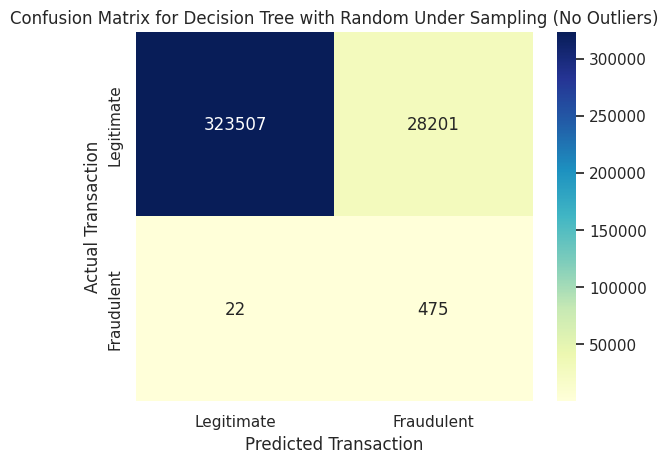

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'YlGnBu')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Decision Tree with Random Under Sampling (No Outliers)')
plt.show()

Random Forest

In [ ]:
rus_RanFor_pipeline = imbpipeline(steps = [['RandomUnderSampler', RandomUnderSampler(sampling_strategy = 'majority',random_state = 300)],
                                      ['RandomForest', RandomForestClassifier(random_state = 300)]])

In [ ]:
RanFor_param = {
    'RandomForest__n_estimators': [100, 200],
    'RandomForest__criterion': ['gini', 'entropy'],
    'RandomForest__max_depth': [5, 10, 20, 25]
}
RanFor_grid_rus_NoOut = RandomizedSearchCV(rus_RanFor_pipeline, param_distributions = RanFor_param, n_iter = 5 ,cv = skf, scoring = 'precision', return_train_score = True  )

In [ ]:
start_time = time.time()
RanFor_grid_rus_NoOut = RanFor_grid_rus_NoOut.fit(X2_train, y2_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:05:49


In [ ]:
RanFor_grid_rus_NoOut.best_estimator_

Pipeline(steps=[('RandomUnderSampler',
                 RandomUnderSampler(random_state=300,
                                    sampling_strategy='majority')),
                ['RandomForest',
                 RandomForestClassifier(criterion='entropy', max_depth=20,
                                        random_state=300)]])

In [ ]:
y_pred_RFrus_NoOut = RanFor_grid_rus_NoOut.best_estimator_.predict(X2_test)

In [ ]:
matthews_corrcoef(y2_test, y_pred_RFrus_NoOut)

0.10491376342385325

In [ ]:
f1_score(y2_test, y_pred_RFrus_NoOut)

0.02529182879377432

In [ ]:
confusion = confusion_matrix(y2_test, y_pred_RFrus_NoOut)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[314650  37058]
 [    16    481]]
TP:  481 , FP:  37058 , TN:  314650 , FN: 16


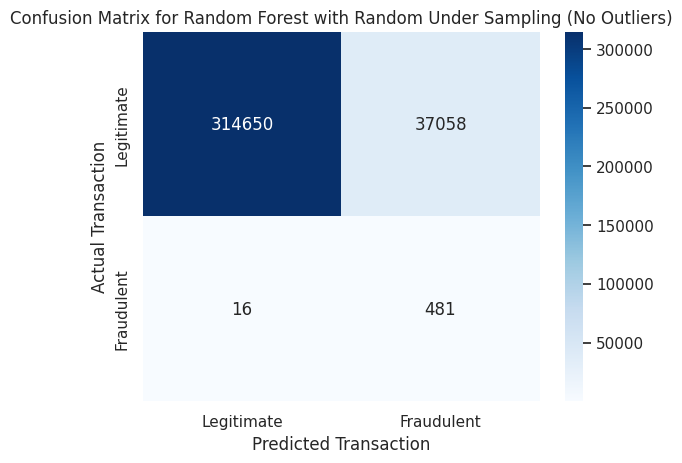

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'Blues')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Random Forest with Random Under Sampling (No Outliers)')
plt.show()

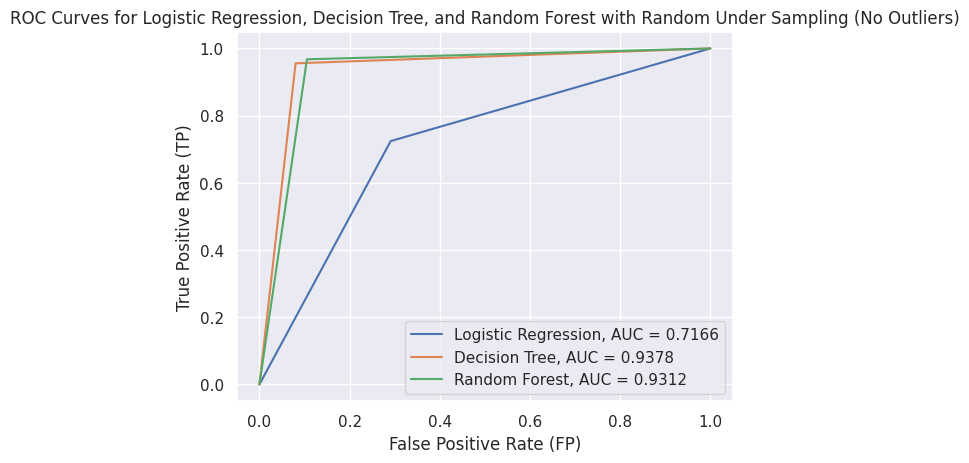

In [ ]:
plt.figure(0).clf()
fp, tp,_ = roc_curve(y2_test, y_pred_logrus_NoOut)
auc = round(roc_auc_score(y2_test, y_pred_logrus_NoOut), 4)
plt.plot(fp, tp, label = 'Logistic Regression, AUC = '+str(auc))

fp, tp,_ = roc_curve(y2_test, y_pred_treerus_NoOut)
auc = round(roc_auc_score(y2_test, y_pred_treerus_NoOut), 4)
plt.plot(fp, tp, label = 'Decision Tree, AUC = '+str(auc))

fp, tp,_ = roc_curve(y2_test, y_pred_RFrus_NoOut)
auc = round(roc_auc_score(y2_test, y_pred_RFrus_NoOut), 4)
plt.plot(fp, tp, label = 'Random Forest, AUC = '+str(auc))

plt.title('ROC Curves for Logistic Regression, Decision Tree, and Random Forest with Random Under Sampling (No Outliers)')
plt.ylabel('True Positive Rate (TP)')
plt.xlabel('False Positive Rate (FP)')
plt.legend()

2. Over Sampling

Logistic Regression

In [ ]:
ros_log_pipeline = imbpipeline(steps = [['RandomOverSampler', RandomOverSampler(sampling_strategy = 'minority',random_state = 300)],
                                      ['LogisticRegression', LogisticRegression(random_state = 300)]])

In [ ]:
log_param = {
    'LogisticRegression__C': [1.0, 0.1, 0.01, 0.001]
}
log_grid_ros_NoOut = RandomizedSearchCV(ros_log_pipeline, param_distributions = log_param, n_iter = 5 , cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
log_grid_ros_NoOut = log_grid_ros_NoOut.fit(X2_train, y2_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

In [ ]:
log_grid_ros_NoOut.best_estimator_

Pipeline(steps=[('RandomOverSampler',
                 RandomOverSampler(random_state=300,
                                   sampling_strategy='minority')),
                ['LogisticRegression',
                 LogisticRegression(C=0.1, random_state=300)]])

In [ ]:
y_pred_logros_NoOut = log_grid_ros_NoOut.best_estimator_.predict(X2_test)

In [ ]:
matthews_corrcoef(y2_test, y_pred_logros_NoOut)

0.04298928324572893

In [ ]:
f1_score(y2_test, y_pred_logros_NoOut)

0.007248937726529304

In [ ]:
confusion = confusion_matrix(y2_test, y_pred_logros_NoOut)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[230973 120735]
 [    56    441]]
TP:  441 , FP:  120735 , TN:  230973 , FN: 56


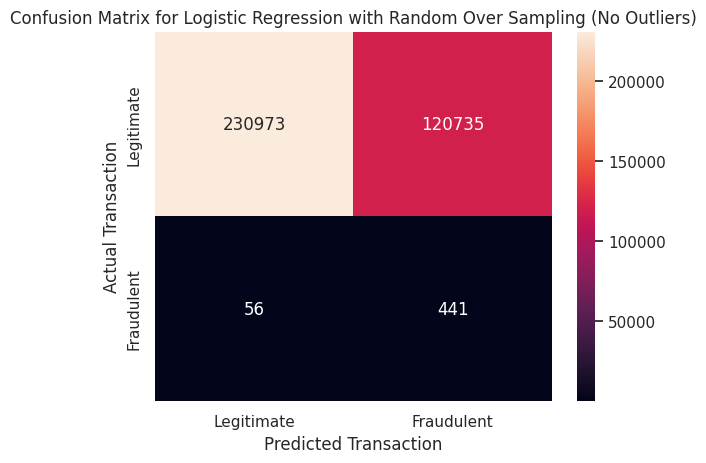

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Logistic Regression with Random Over Sampling (No Outliers)')
plt.show()

Decision Tree

In [ ]:
ros_tree_pipeline = imbpipeline(steps = [['RandomOverSampler', RandomOverSampler(sampling_strategy = 'minority',random_state = 300)],
                                      ['DecisionTree', tree.DecisionTreeClassifier(random_state = 300)]])

In [ ]:
tree_param = {
    'DecisionTree__criterion': ['gini', 'entropy'],
    'DecisionTree__max_depth': [5, 10, 20, 25]
}
tree_grid_ros_NoOut = RandomizedSearchCV(ros_tree_pipeline, param_distributions = tree_param, n_iter = 5, cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
tree_grid_ros_NoOut = tree_grid_ros_NoOut.fit(X2_train, y2_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:10:35


In [ ]:
tree_grid_ros_NoOut.best_estimator_

Pipeline(steps=[('RandomOverSampler',
                 RandomOverSampler(random_state=300,
                                   sampling_strategy='minority')),
                ['DecisionTree',
                 DecisionTreeClassifier(criterion='entropy', max_depth=25,
                                        random_state=300)]])

In [ ]:
y_pred_treeros_NoOut = tree_grid_ros_NoOut.best_estimator_.predict(X2_test)

In [ ]:
matthews_corrcoef(y2_test, y_pred_treeros_NoOut)

0.23137048928503462

In [ ]:
f1_score(y2_test, y_pred_treeros_NoOut)

0.14972014925373134

In [ ]:
confusion = confusion_matrix(y2_test, y_pred_treeros_NoOut)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[348238   3470]
 [   176    321]]
TP:  321 , FP:  3470 , TN:  348238 , FN: 176


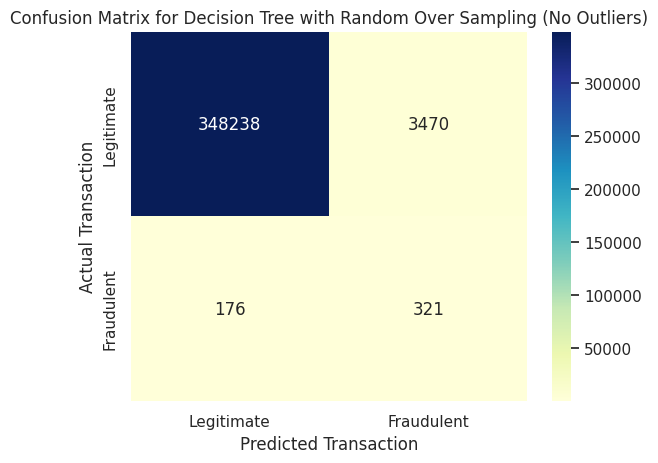

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'YlGnBu')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Decision Tree with Random Over Sampling (No Outliers)')
plt.show()

Random Forest

In [ ]:
ros_RanFor_pipeline = imbpipeline(steps = [['RandomOverSampler', RandomOverSampler(sampling_strategy = 'minority',random_state = 300)],
                                      ['RandomForest', RandomForestClassifier(random_state = 300)]])

In [ ]:
RanFor_param = {
    'RandomForest__n_estimators': [100, 200],
    'RandomForest__criterion': ['gini', 'entropy'],
    'RandomForest__max_depth': [5, 10, 20, 25]
}
RanFor_grid_ros_NoOut = RandomizedSearchCV(ros_RanFor_pipeline, param_distributions = RanFor_param, n_iter = 5 ,cv = skf, scoring = 'precision', return_train_score = True  )

In [ ]:
start_time = time.time()
RanFor_grid_ros_NoOut = RanFor_grid_ros_NoOut.fit(X2_train, y2_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 02:27:25


In [ ]:
RanFor_grid_ros_NoOut.best_estimator_

Pipeline(steps=[('RandomOverSampler',
                 RandomOverSampler(random_state=300,
                                   sampling_strategy='minority')),
                ['RandomForest',
                 RandomForestClassifier(criterion='entropy', max_depth=25,
                                        n_estimators=200, random_state=300)]])

In [ ]:
y_pred_RFros_NoOut = RanFor_grid_ros_NoOut.best_estimator_.predict(X2_test)

In [ ]:
matthews_corrcoef(y2_test, y_pred_RFros_NoOut)

0.29594274953746535

In [ ]:
f1_score(y2_test, y_pred_RFros_NoOut)

0.23340961098398166

In [ ]:
confusion = confusion_matrix(y2_test, y_pred_RFros_NoOut)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[349889   1819]
 [   191    306]]
TP:  306 , FP:  1819 , TN:  349889 , FN: 191


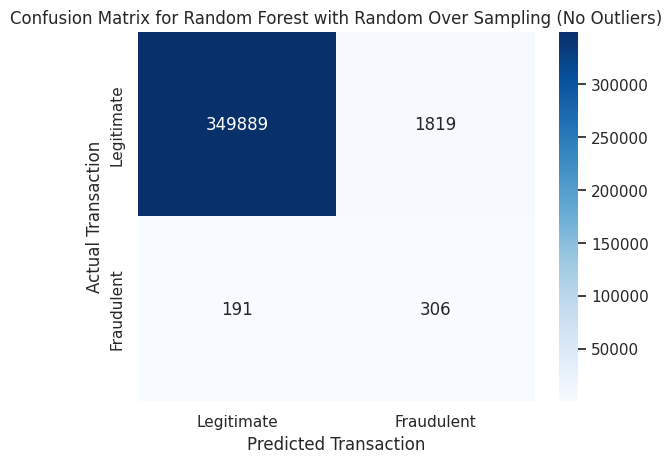

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'Blues')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Random Forest with Random Over Sampling (No Outliers)')
plt.show()

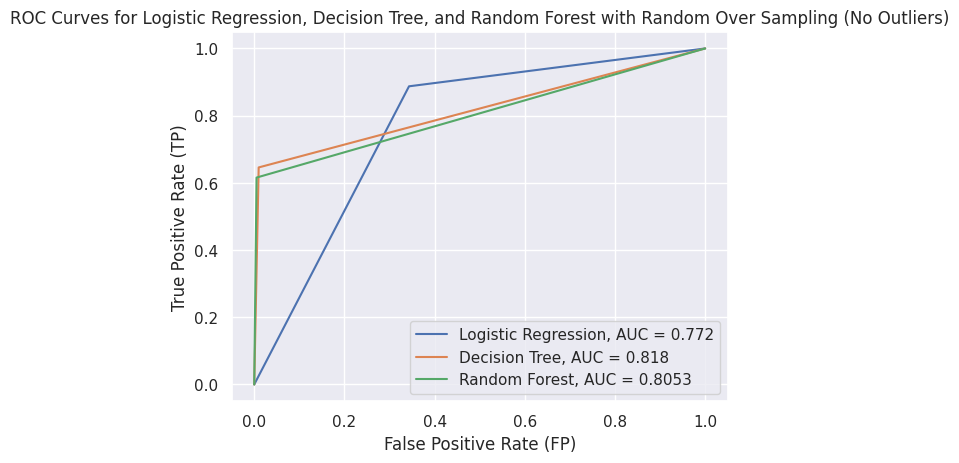

In [ ]:
plt.figure(0).clf()
fp, tp,_ = roc_curve(y2_test, y_pred_logros_NoOut)
auc = round(roc_auc_score(y2_test, y_pred_logros_NoOut), 4)
plt.plot(fp, tp, label = 'Logistic Regression, AUC = '+str(auc))

fp, tp,_ = roc_curve(y2_test, y_pred_treeros_NoOut)
auc = round(roc_auc_score(y2_test, y_pred_treeros_NoOut), 4)
plt.plot(fp, tp, label = 'Decision Tree, AUC = '+str(auc))

fp, tp,_ = roc_curve(y2_test, y_pred_RFros_NoOut)
auc = round(roc_auc_score(y2_test, y_pred_RFros_NoOut), 4)
plt.plot(fp, tp, label = 'Random Forest, AUC = '+str(auc))

plt.title('ROC Curves for Logistic Regression, Decision Tree, and Random Forest with Random Over Sampling (No Outliers)')
plt.ylabel('True Positive Rate (TP)')
plt.xlabel('False Positive Rate (FP)')
plt.legend()

3. SMOTE

Logistic Regression

In [ ]:
smote_log_pipeline = imbpipeline(steps = [['SMOTE', SMOTE(random_state = 300)],
                                      ['LogisticRegression', LogisticRegression(random_state = 300)]])

In [ ]:
log_param = {
    'LogisticRegression__C': [1.0, 0.1, 0.01, 0.001]
}
log_grid_smote_NoOut = RandomizedSearchCV(smote_log_pipeline, param_distributions = log_param, n_iter = 5 , cv = skf, scoring = 'precision', return_train_score = True)


In [ ]:
start_time = time.time()
log_grid_smote_NoOut = log_grid_smote_NoOut.fit(X2_train, y2_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

In [ ]:
log_grid_smote_NoOut.best_estimator_

Pipeline(steps=[('SMOTE', SMOTE(random_state=300)),
                ['LogisticRegression', LogisticRegression(random_state=300)]])

In [ ]:
y_pred_logSmote_NoOut = log_grid_smote_NoOut.best_estimator_.predict(X2_test)

In [ ]:
matthews_corrcoef(y2_test, y_pred_logSmote_NoOut)

0.052197309630909565

In [ ]:
f1_score(y2_test, y_pred_logSmote_NoOut)

0.023927318521183773

In [ ]:
confusion = confusion_matrix(y2_test, y_pred_logSmote_NoOut)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[341221  10487]
 [   364    133]]
TP:  133 , FP:  10487 , TN:  341221 , FN: 364


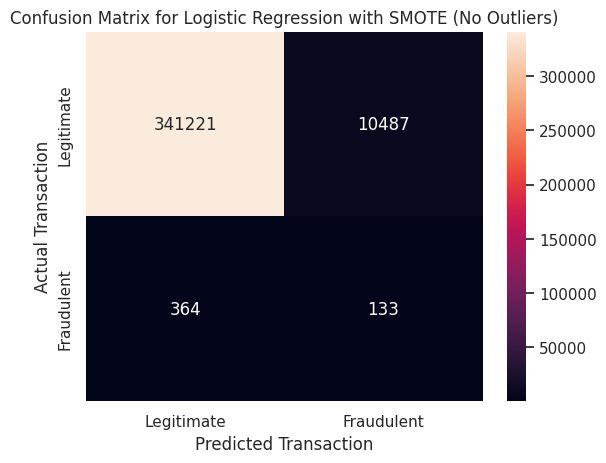

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Logistic Regression with SMOTE (No Outliers)')
plt.show()

Decision Tree

In [ ]:
smote_tree_pipeline = imbpipeline(steps = [['SMOTE', SMOTE(random_state = 300)],
                                      ['DecisionTree', tree.DecisionTreeClassifier(random_state = 300)]])

In [ ]:
tree_param = {
    'DecisionTree__criterion': ['gini', 'entropy'],
    'DecisionTree__max_depth': [5, 10, 20, 25]
}
tree_grid_smote_NoOut = RandomizedSearchCV(smote_tree_pipeline, param_distributions = tree_param, n_iter = 5, cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
tree_grid_smote_NoOut = tree_grid_smote_NoOut.fit(X2_train, y2_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:16:08


In [ ]:
tree_grid_smote_NoOut.best_estimator_

Pipeline(steps=[('SMOTE', SMOTE(random_state=300)),
                ['DecisionTree',
                 DecisionTreeClassifier(criterion='entropy', max_depth=25,
                                        random_state=300)]])

In [ ]:
y_pred_treeSmote_NoOut = tree_grid_smote_NoOut.best_estimator_.predict(X2_test)

In [ ]:
matthews_corrcoef(y2_test, y_pred_treeSmote_NoOut)

0.2014747977281582

In [ ]:
f1_score(y2_test, y_pred_treeSmote_NoOut)

0.12149901380670611

In [ ]:
confusion = confusion_matrix(y2_test, y_pred_treeSmote_NoOut)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[347443   4265]
 [   189    308]]
TP:  308 , FP:  4265 , TN:  347443 , FN: 189


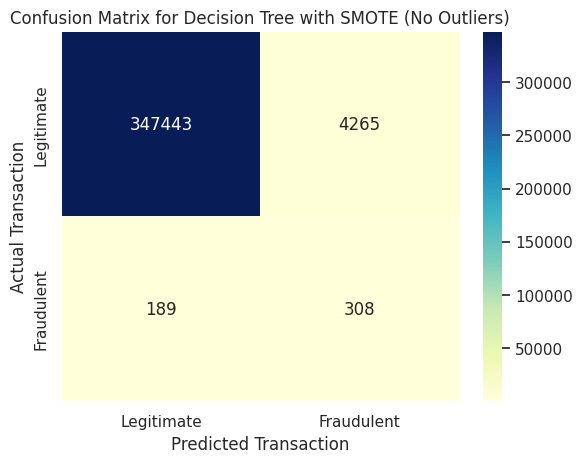

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'YlGnBu')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Decision Tree with SMOTE (No Outliers)')
plt.show()

Random Forest

In [ ]:
smote_RanFor_pipeline = imbpipeline(steps = [['SMOTE', SMOTE(random_state = 300)],
                                      ['RandomForest', RandomForestClassifier(random_state = 300)]])

In [ ]:
RanFor_param = {
    'RandomForest__n_estimators': [100, 200],
    'RandomForest__criterion': ['gini', 'entropy'],
    'RandomForest__max_depth': [5, 10, 20, 25]
}
RanFor_grid_smote_NoOut = RandomizedSearchCV(smote_RanFor_pipeline, param_distributions = RanFor_param, n_iter = 5 ,cv = skf, scoring = 'precision', return_train_score = True  )

In [ ]:
start_time = time.time()
RanFor_grid_smote_NoOut = RanFor_grid_smote_NoOut.fit(X2_train, y2_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 02:30:49


In [ ]:
RanFor_grid_smote_NoOut.best_estimator_

Pipeline(steps=[('SMOTE', SMOTE(random_state=300)),
                ['RandomForest',
                 RandomForestClassifier(max_depth=25, n_estimators=200,
                                        random_state=300)]])

In [ ]:
y_pred_RFSmote_NoOut = RanFor_grid_smote_NoOut.best_estimator_.predict(X2_test)

In [ ]:
matthews_corrcoef(y2_test, y_pred_RFSmote_NoOut)

0.17754743492775035

In [ ]:
f1_score(y2_test, y_pred_RFSmote_NoOut)

0.08771266540642722

In [ ]:
confusion = confusion_matrix(y2_test, y_pred_RFSmote_NoOut)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[344618   7090]
 [   149    348]]
TP:  348 , FP:  7090 , TN:  344618 , FN: 149


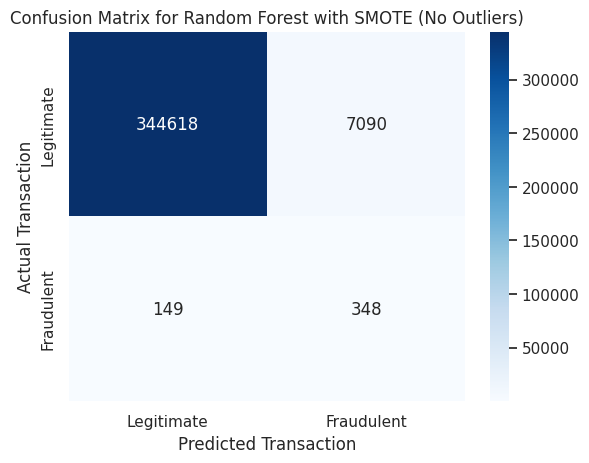

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'Blues')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Random Forest with SMOTE (No Outliers)')
plt.show()

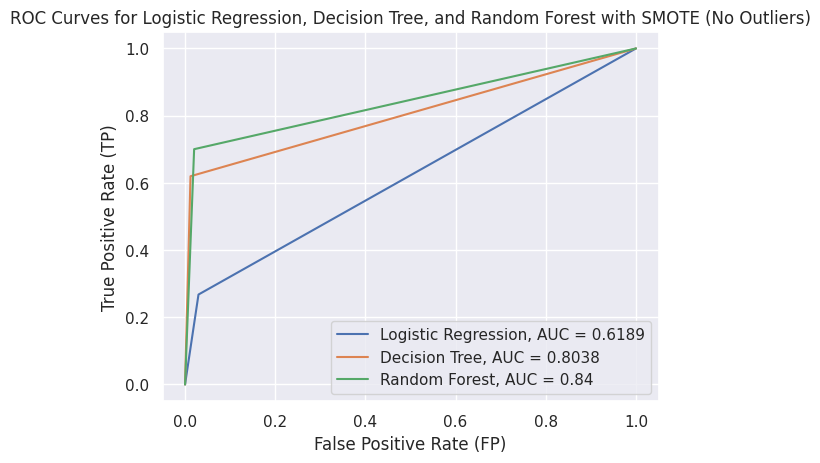

In [ ]:
plt.figure(0).clf()
fp, tp,_ = roc_curve(y2_test, y_pred_logSmote_NoOut)
auc = round(roc_auc_score(y2_test, y_pred_logSmote_NoOut), 4)
plt.plot(fp, tp, label = 'Logistic Regression, AUC = '+str(auc))

fp, tp,_ = roc_curve(y2_test, y_pred_treeSmote_NoOut)
auc = round(roc_auc_score(y2_test, y_pred_treeSmote_NoOut), 4)
plt.plot(fp, tp, label = 'Decision Tree, AUC = '+str(auc))

fp, tp,_ = roc_curve(y2_test, y_pred_RFSmote_NoOut)
auc = round(roc_auc_score(y2_test, y_pred_RFSmote_NoOut), 4)
plt.plot(fp, tp, label = 'Random Forest, AUC = '+str(auc))

plt.title('ROC Curves for Logistic Regression, Decision Tree, and Random Forest with SMOTE (No Outliers)')
plt.ylabel('True Positive Rate (TP)')
plt.xlabel('False Positive Rate (FP)')
plt.legend()

**C) Original Dataset with Selected Features**

In [ ]:
y3 = fraud_trans_SelectFeat.is_fraud
col = 'is_fraud'
X3 = fraud_trans_SelectFeat.loc[:, fraud_trans_SelectFeat.columns != col]

In [ ]:
skf = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 300)

In [ ]:
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size = 0.3, random_state = 300)

1. Under Sampling

Logistic Regression

In [ ]:
rus_log_pipeline = imbpipeline(steps = [['RandomUnderSampler', RandomUnderSampler(sampling_strategy = 'majority',random_state = 300)],
                                      ['LogisticRegression', LogisticRegression(random_state = 300)]])

In [ ]:
log_param = {
    'LogisticRegression__C': [1.0, 0.1, 0.01, 0.001]
}
log_grid_rus = RandomizedSearchCV(rus_log_pipeline, param_distributions = log_param, n_iter = 5 , cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
log_grid_rus = log_grid_rus.fit(X3_train, y3_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

In [ ]:
log_grid_rus.best_estimator_

Pipeline(steps=[('RandomUnderSampler',
                 RandomUnderSampler(random_state=300,
                                    sampling_strategy='majority')),
                ['LogisticRegression',
                 LogisticRegression(C=0.001, random_state=300)]])

In [ ]:
y_pred_logrus_SelectFeat = log_grid_rus.best_estimator_.predict(X3_test)

In [ ]:
matthews_corrcoef(y3_test, y_pred_logrus_SelectFeat)

0.2517232701171095

In [ ]:
f1_score(y3_test, y_pred_logrus_SelectFeat)

0.1609813600530465

In [ ]:
confusion = confusion_matrix(y3_test, y_pred_logrus_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[530758  22062]
 [   714   2185]]
TP:  2185 , FP:  22062 , TN:  530758 , FN: 714


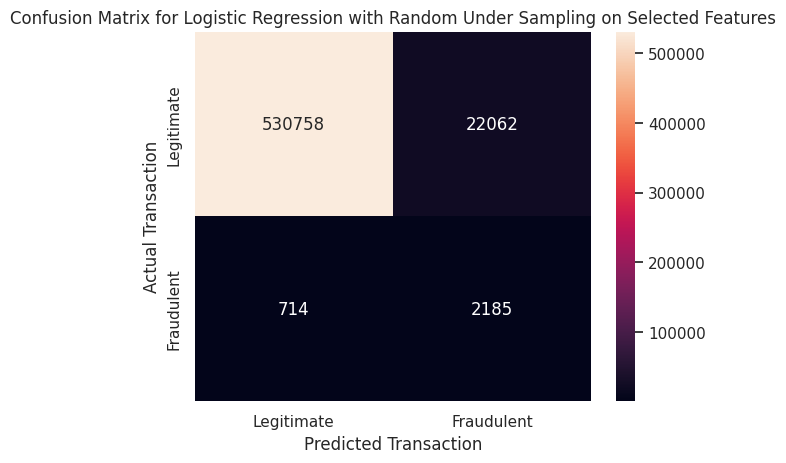

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Logistic Regression with Random Under Sampling on Selected Features')
plt.show()

In [ ]:
print(classification_report(y3_test, y_pred_logrus_SelectFeat))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98    552820
           1       0.09      0.75      0.16      2899

    accuracy                           0.96    555719
   macro avg       0.54      0.86      0.57    555719
weighted avg       0.99      0.96      0.97    555719



Decision Tree

In [ ]:
rus_tree_pipeline = imbpipeline(steps = [['RandomUnderSampler', RandomUnderSampler(sampling_strategy = 'majority',random_state = 300)],
                                      ['DecisionTree', tree.DecisionTreeClassifier(random_state = 300)]])

In [ ]:
tree_param = {
    'DecisionTree__criterion': ['gini', 'entropy'],
    'DecisionTree__max_depth': [5, 10, 20, 25]
}
tree_grid_rus = RandomizedSearchCV(rus_tree_pipeline, param_distributions = tree_param, n_iter = 5, cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
tree_grid_rus = tree_grid_rus.fit(X3_train, y3_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:00:54


In [ ]:
tree_grid_rus.best_estimator_

Pipeline(steps=[('RandomUnderSampler',
                 RandomUnderSampler(random_state=300,
                                    sampling_strategy='majority')),
                ['DecisionTree',
                 DecisionTreeClassifier(criterion='entropy', max_depth=10,
                                        random_state=300)]])

In [ ]:
y_pred_treerus_SelectFeat = tree_grid_rus.best_estimator_.predict(X3_test)

In [ ]:
matthews_corrcoef(y3_test, y_pred_treerus_SelectFeat)

0.2833200489959533

In [ ]:
f1_score(y3_test, y_pred_treerus_SelectFeat)

0.16378899738032868

In [ ]:
confusion = confusion_matrix(y3_test, y_pred_treerus_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[524878  27942]
 [   148   2751]]
TP:  2751 , FP:  27942 , TN:  524878 , FN: 148


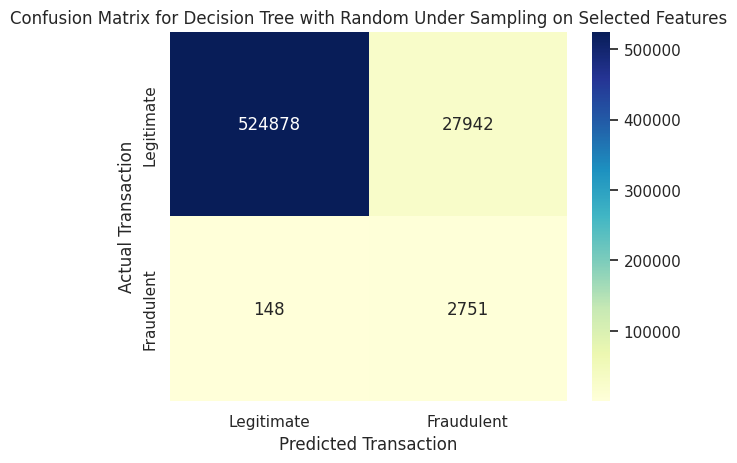

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'YlGnBu')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Decision Tree with Random Under Sampling on Selected Features')
plt.show()

In [ ]:
print(classification_report(y3_test, y_pred_treerus_SelectFeat))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97    552820
           1       0.09      0.95      0.16      2899

    accuracy                           0.95    555719
   macro avg       0.54      0.95      0.57    555719
weighted avg       0.99      0.95      0.97    555719



Random Forest

In [ ]:
rus_RanFor_pipeline = imbpipeline(steps = [['RandomUnderSampler', RandomUnderSampler(sampling_strategy = 'majority',random_state = 300)],
                                      ['RandomForest', RandomForestClassifier(random_state = 300)]])

In [ ]:
RanFor_param = {
    'RandomForest__n_estimators': [100, 200],
    'RandomForest__criterion': ['gini', 'entropy'],
    'RandomForest__max_depth': [5, 10, 20, 25]
}
RanFor_grid_rus = RandomizedSearchCV(rus_RanFor_pipeline, param_distributions = RanFor_param, n_iter = 5 ,cv = skf, scoring = 'precision', return_train_score = True  )

In [ ]:
start_time = time.time()
RanFor_grid_rus = RanFor_grid_rus.fit(X3_train, y3_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:15:30


In [ ]:
RanFor_grid_rus.best_estimator_

Pipeline(steps=[('RandomUnderSampler',
                 RandomUnderSampler(random_state=300,
                                    sampling_strategy='majority')),
                ['RandomForest',
                 RandomForestClassifier(criterion='entropy', max_depth=20,
                                        n_estimators=200, random_state=300)]])

In [ ]:
y_pred_RFrus_SelectFeat = RanFor_grid_rus.best_estimator_.predict(X3_test)

In [ ]:
matthews_corrcoef(y3_test, y_pred_RFrus_SelectFeat)

0.4582072751845967

In [ ]:
f1_score(y3_test, y_pred_RFrus_SelectFeat)

0.37098229781325925

In [ ]:
confusion = confusion_matrix(y3_test, y_pred_RFrus_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[543986   8834]
 [   227   2672]]
TP:  2672 , FP:  8834 , TN:  543986 , FN: 227


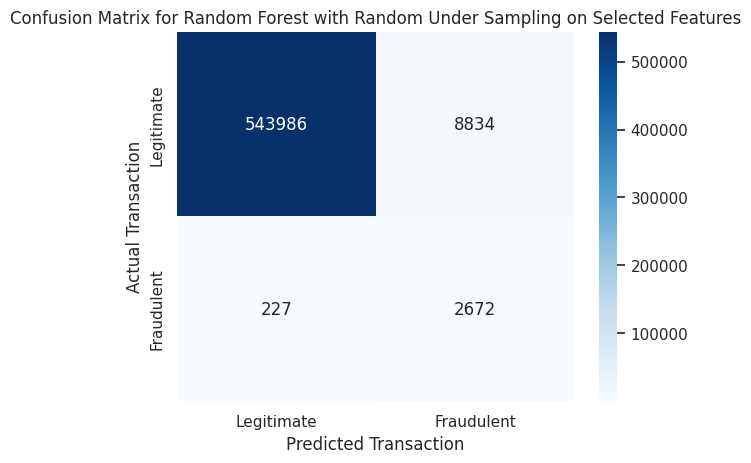

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'Blues')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Random Forest with Random Under Sampling on Selected Features')
plt.show()

In [ ]:
print(classification_report(y3_test, y_pred_RFrus_SelectFeat))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99    552820
           1       0.23      0.92      0.37      2899

    accuracy                           0.98    555719
   macro avg       0.62      0.95      0.68    555719
weighted avg       1.00      0.98      0.99    555719



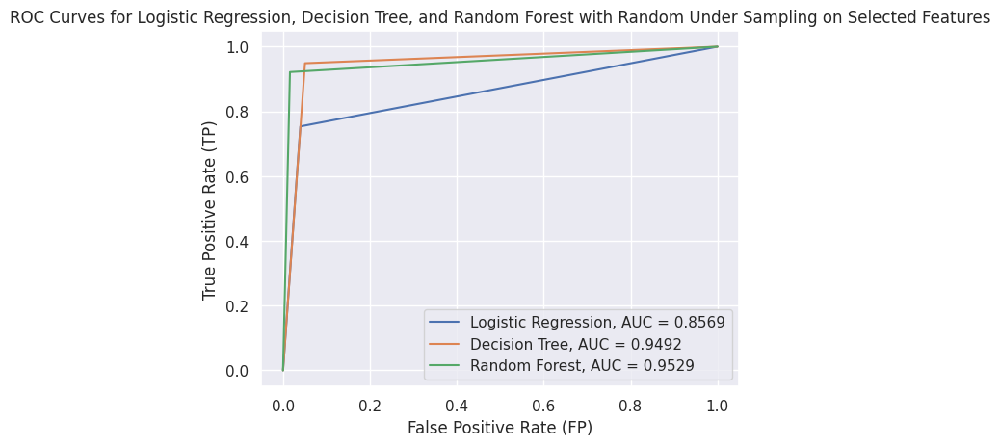

In [ ]:
plt.figure(0).clf()
fp, tp,_ = roc_curve(y3_test, y_pred_logrus_SelectFeat)
auc = round(roc_auc_score(y3_test, y_pred_logrus_SelectFeat), 4)
plt.plot(fp, tp, label = 'Logistic Regression, AUC = '+str(auc))

fp, tp,_ = roc_curve(y3_test, y_pred_treerus_SelectFeat)
auc = round(roc_auc_score(y3_test, y_pred_treerus_SelectFeat), 4)
plt.plot(fp, tp, label = 'Decision Tree, AUC = '+str(auc))

fp, tp,_ = roc_curve(y3_test, y_pred_RFrus_SelectFeat)
auc = round(roc_auc_score(y3_test, y_pred_RFrus_SelectFeat), 4)
plt.plot(fp, tp, label = 'Random Forest, AUC = '+str(auc))

plt.title('ROC Curves for Logistic Regression, Decision Tree, and Random Forest with Random Under Sampling on Selected Features')
plt.ylabel('True Positive Rate (TP)')
plt.xlabel('False Positive Rate (FP)')
plt.legend()

2. Over Sampling

Logistic Regression

In [ ]:
ros_log_pipeline = imbpipeline(steps = [['RandomOverSampler', RandomOverSampler(sampling_strategy = 'minority',random_state = 300)],
                                      ['LogisticRegression', LogisticRegression(random_state = 300)]])

In [ ]:
log_param = {
    'LogisticRegression__C': [1.0, 0.1, 0.01, 0.001]
}
log_grid_ros = RandomizedSearchCV(ros_log_pipeline, param_distributions = log_param, n_iter = 5 , cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
log_grid_ros = log_grid_ros.fit(X3_train, y3_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

In [ ]:
log_grid_ros.best_estimator_

Pipeline(steps=[('RandomOverSampler',
                 RandomOverSampler(random_state=300,
                                   sampling_strategy='minority')),
                ['LogisticRegression',
                 LogisticRegression(C=0.001, random_state=300)]])

In [ ]:
y_pred_logros_SelectFeat = log_grid_ros.best_estimator_.predict(X3_test)

In [ ]:
matthews_corrcoef(y3_test, y_pred_logros_SelectFeat)

0.1587026408171573

In [ ]:
f1_score(y3_test, y_pred_logros_SelectFeat)

0.07507902605724048

In [ ]:
confusion = confusion_matrix(y3_test, y_pred_logros_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[499391  53429]
 [   702   2197]]
TP:  2197 , FP:  53429 , TN:  499391 , FN: 702


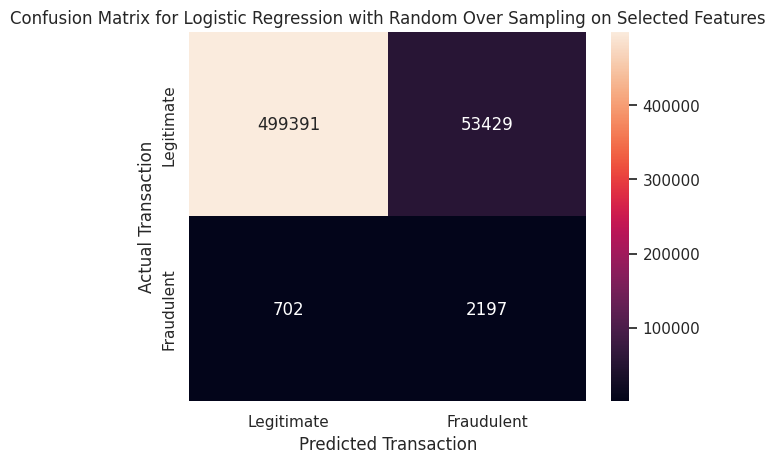

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Logistic Regression with Random Over Sampling on Selected Features')
plt.show()

In [ ]:
print(classification_report(y3_test, y_pred_logros_SelectFeat))

              precision    recall  f1-score   support

           0       1.00      0.90      0.95    552820
           1       0.04      0.76      0.08      2899

    accuracy                           0.90    555719
   macro avg       0.52      0.83      0.51    555719
weighted avg       0.99      0.90      0.94    555719



Decision Tree

In [ ]:
ros_tree_pipeline = imbpipeline(steps = [['RandomOverSampler', RandomOverSampler(sampling_strategy = 'minority',random_state = 300)],
                                      ['DecisionTree', tree.DecisionTreeClassifier(random_state = 300)]])

In [ ]:
tree_param = {
    'DecisionTree__criterion': ['gini', 'entropy'],
    'DecisionTree__max_depth': [5, 10, 20, 25]
}
tree_grid_ros = RandomizedSearchCV(ros_tree_pipeline, param_distributions = tree_param, n_iter = 5, cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
tree_grid_ros = tree_grid_ros.fit(X3_train, y3_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:16:22


In [ ]:
tree_grid_ros.best_estimator_

Pipeline(steps=[('RandomOverSampler',
                 RandomOverSampler(random_state=300,
                                   sampling_strategy='minority')),
                ['DecisionTree',
                 DecisionTreeClassifier(max_depth=25, random_state=300)]])

In [ ]:
y_pred_treeros_SelectFeat = tree_grid_ros.best_estimator_.predict(X3_test)

In [ ]:
matthews_corrcoef(y3_test, y_pred_treeros_SelectFeat)

0.4321737777597673

In [ ]:
f1_score(y3_test, y_pred_treeros_SelectFeat)

0.35605511240029003

In [ ]:
confusion = confusion_matrix(y3_test, y_pred_treeros_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[544384   8436]
 [   444   2455]]
TP:  2455 , FP:  8436 , TN:  544384 , FN: 444


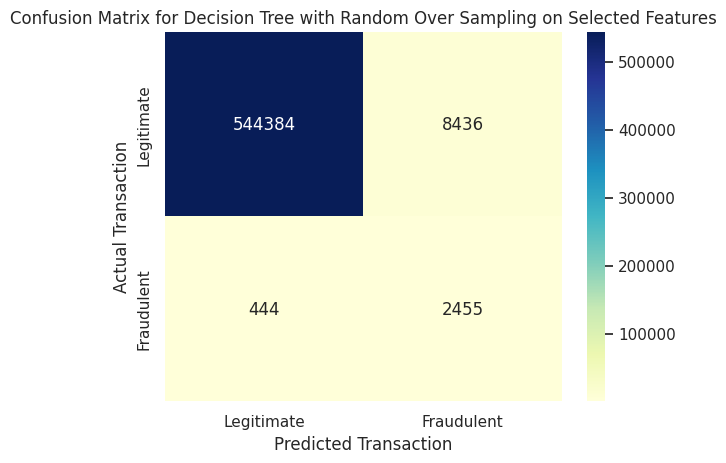

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'YlGnBu')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Decision Tree with Random Over Sampling on Selected Features')
plt.show()

In [ ]:
print(classification_report(y3_test, y_pred_treeros_SelectFeat))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99    552820
           1       0.23      0.85      0.36      2899

    accuracy                           0.98    555719
   macro avg       0.61      0.92      0.67    555719
weighted avg       1.00      0.98      0.99    555719



Random Forest

In [ ]:
ros_RanFor_pipeline = imbpipeline(steps = [['RandomOverSampler', RandomOverSampler(sampling_strategy = 'minority',random_state = 300)],
                                      ['RandomForest', RandomForestClassifier(random_state = 300)]])

In [ ]:
RanFor_param = {
    'RandomForest__n_estimators': [100, 200],
    'RandomForest__criterion': ['gini', 'entropy'],
    'RandomForest__max_depth': [5, 10, 20, 25]
}
RanFor_grid_ros = RandomizedSearchCV(ros_RanFor_pipeline, param_distributions = RanFor_param, n_iter = 5 ,cv = skf, scoring = 'precision', return_train_score = True  )

In [ ]:
start_time = time.time()
RanFor_grid_ros = RanFor_grid_ros.fit(X3_train, y3_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 04:32:31


In [ ]:
RanFor_grid_ros.best_estimator_

Pipeline(steps=[('RandomOverSampler',
                 RandomOverSampler(random_state=300,
                                   sampling_strategy='minority')),
                ['RandomForest',
                 RandomForestClassifier(criterion='entropy', max_depth=20,
                                        random_state=300)]])

In [ ]:
y_pred_RFros_SelectFeat = RanFor_grid_ros.best_estimator_.predict(X3_test)

In [ ]:
matthews_corrcoef(y3_test, y_pred_RFros_SelectFeat)

0.6908880521134161

In [ ]:
f1_score(y3_test, y_pred_RFros_SelectFeat)

0.6775911511675543

In [ ]:
confusion = confusion_matrix(y3_test, y_pred_RFros_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[550877   1943]
 [   418   2481]]
TP:  2481 , FP:  1943 , TN:  550877 , FN: 418


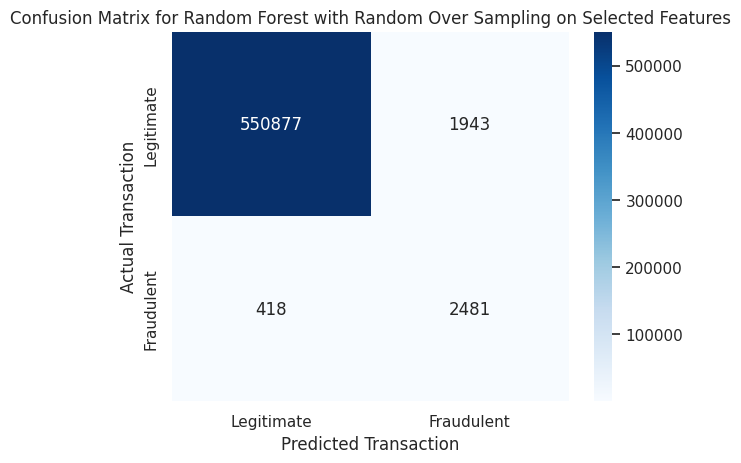

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'Blues')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Random Forest with Random Over Sampling on Selected Features')
plt.show()

In [ ]:
print(classification_report(y3_test, y_pred_RFros_SelectFeat))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    552820
           1       0.56      0.86      0.68      2899

    accuracy                           1.00    555719
   macro avg       0.78      0.93      0.84    555719
weighted avg       1.00      1.00      1.00    555719



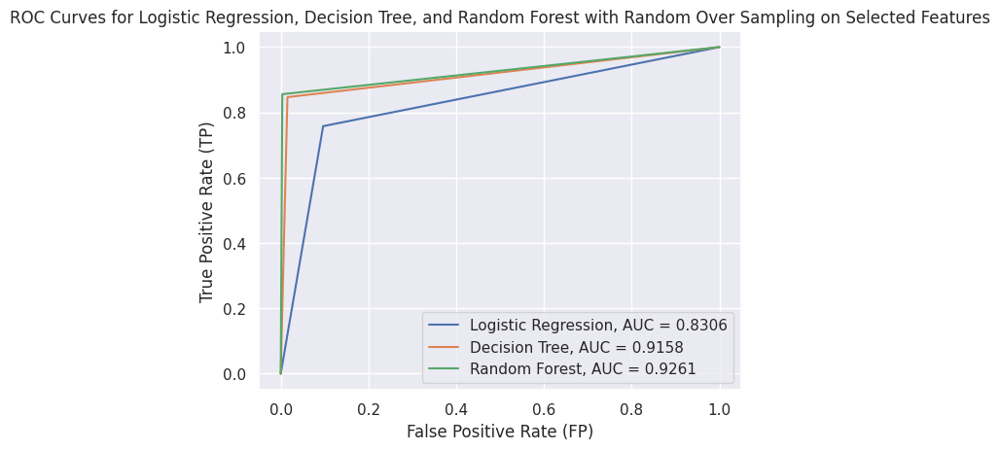

In [ ]:
plt.figure(0).clf()
fp, tp,_ = roc_curve(y3_test, y_pred_logros_SelectFeat)
auc = round(roc_auc_score(y3_test, y_pred_logros_SelectFeat), 4)
plt.plot(fp, tp, label = 'Logistic Regression, AUC = '+str(auc))

fp, tp,_ = roc_curve(y3_test, y_pred_treeros_SelectFeat)
auc = round(roc_auc_score(y3_test, y_pred_treeros_SelectFeat), 4)
plt.plot(fp, tp, label = 'Decision Tree, AUC = '+str(auc))

fp, tp,_ = roc_curve(y3_test, y_pred_RFros_SelectFeat)
auc = round(roc_auc_score(y3_test, y_pred_RFros_SelectFeat), 4)
plt.plot(fp, tp, label = 'Random Forest, AUC = '+str(auc))

plt.title('ROC Curves for Logistic Regression, Decision Tree, and Random Forest with Random Over Sampling on Selected Features')
plt.ylabel('True Positive Rate (TP)')
plt.xlabel('False Positive Rate (FP)')
plt.legend()

3. SMOTE

Logistic Regression

In [ ]:
smote_log_pipeline = imbpipeline(steps = [['SMOTE', SMOTE(random_state = 300)],
                                      ['LogisticRegression', LogisticRegression(random_state = 300)]])

In [ ]:
log_param = {
    'LogisticRegression__C': [1.0, 0.1, 0.01, 0.001]
}
log_grid_smote = RandomizedSearchCV(smote_log_pipeline, param_distributions = log_param, n_iter = 5 , cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
log_grid_smote = log_grid_smote.fit(X3_train, y3_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

In [ ]:
log_grid_smote.best_estimator_

Pipeline(steps=[('SMOTE', SMOTE(random_state=300)),
                ['LogisticRegression',
                 LogisticRegression(C=0.01, random_state=300)]])

In [ ]:
y_pred_logSmote_SelectFeat = log_grid_smote.best_estimator_.predict(X3_test)

In [ ]:
matthews_corrcoef(y3_test, y_pred_logSmote_SelectFeat)

0.30518385960093986

In [ ]:
f1_score(y3_test, y_pred_logSmote_SelectFeat)

0.23452730475631237

In [ ]:
confusion = confusion_matrix(y3_test, y_pred_logSmote_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[540686  12134]
 [   902   1997]]
TP:  1997 , FP:  12134 , TN:  540686 , FN: 902


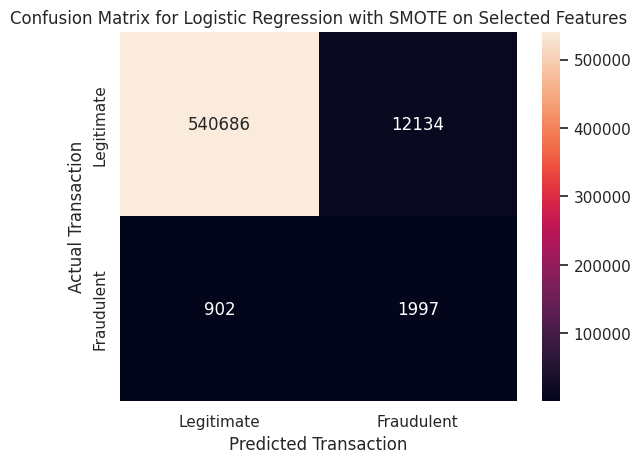

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Logistic Regression with SMOTE on Selected Features')
plt.show()

Decision Tree

In [ ]:
smote_tree_pipeline = imbpipeline(steps = [['SMOTE', SMOTE(random_state = 300)],
                                      ['DecisionTree', tree.DecisionTreeClassifier(random_state = 300)]])

In [ ]:
tree_param = {
    'DecisionTree__criterion': ['gini', 'entropy'],
    'DecisionTree__max_depth': [5, 10, 20, 25]
}
tree_grid_smote = RandomizedSearchCV(smote_tree_pipeline, param_distributions = tree_param, n_iter = 5, cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
tree_grid_smote = tree_grid_smote.fit(X3_train, y3_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:29:29


In [ ]:
tree_grid_smote.best_estimator_

Pipeline(steps=[('SMOTE', SMOTE(random_state=300)),
                ['DecisionTree',
                 DecisionTreeClassifier(criterion='entropy', max_depth=25,
                                        random_state=300)]])

In [ ]:
y_pred_treeSmote_SelectFeat = tree_grid_smote.best_estimator_.predict(X3_test)

In [ ]:
matthews_corrcoef(y3_test, y_pred_treeSmote_SelectFeat)

0.30199520450247247

In [ ]:
f1_score(y3_test, y_pred_treeSmote_SelectFeat)

0.20903775551828854

In [ ]:
confusion = confusion_matrix(y3_test, y_pred_treeSmote_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[535962  16858]
 [   593   2306]]
TP:  2306 , FP:  16858 , TN:  535962 , FN: 593


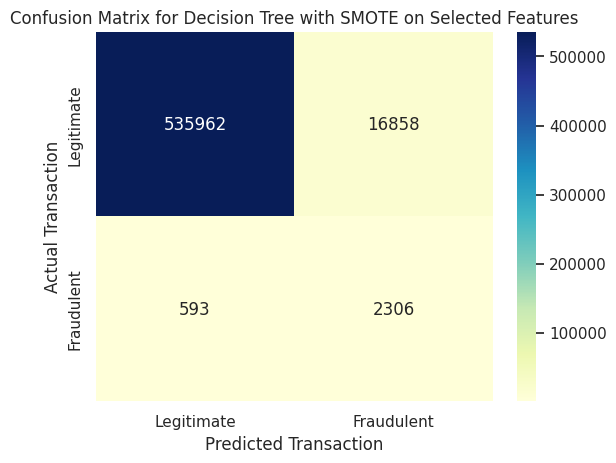

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'YlGnBu')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Decision Tree with SMOTE on Selected Features')
plt.show()

Random Forest

In [ ]:
smote_RanFor_pipeline = imbpipeline(steps = [['SMOTE', SMOTE(random_state = 300)],
                                      ['RandomForest', RandomForestClassifier(random_state = 300)]])

In [ ]:
RanFor_param = {
    'RandomForest__n_estimators': [100, 200],
    'RandomForest__criterion': ['gini', 'entropy'],
    'RandomForest__max_depth': [5, 10, 20, 25]
}
RanFor_grid_smote = RandomizedSearchCV(smote_RanFor_pipeline, param_distributions = RanFor_param, n_iter = 5 ,cv = skf, scoring = 'precision', return_train_score = True  )

In [ ]:
start_time = time.time()
RanFor_grid_smote = RanFor_grid_smote.fit(X3_train, y3_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 09:06:45


In [ ]:
RanFor_grid_smote.best_estimator_

Pipeline(steps=[('SMOTE', SMOTE(random_state=300)),
                ['RandomForest',
                 RandomForestClassifier(criterion='entropy', max_depth=25,
                                        random_state=300)]])

In [ ]:
y_pred_RFSmote_SelectFeat = RanFor_grid_smote.best_estimator_.predict(X3_test)

In [ ]:
matthews_corrcoef(y3_test, y_pred_RFSmote_SelectFeat)

0.5553304564604994

In [ ]:
f1_score(y3_test, y_pred_RFSmote_SelectFeat)

0.5200043845226351

In [ ]:
confusion = confusion_matrix(y3_test, y_pred_RFSmote_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[548968   3852]
 [   527   2372]]
TP:  2372 , FP:  3852 , TN:  548968 , FN: 527


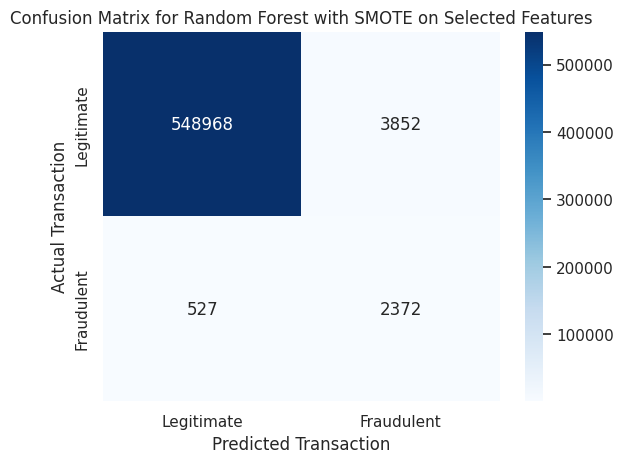

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'Blues')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Random Forest with SMOTE on Selected Features')
plt.show()

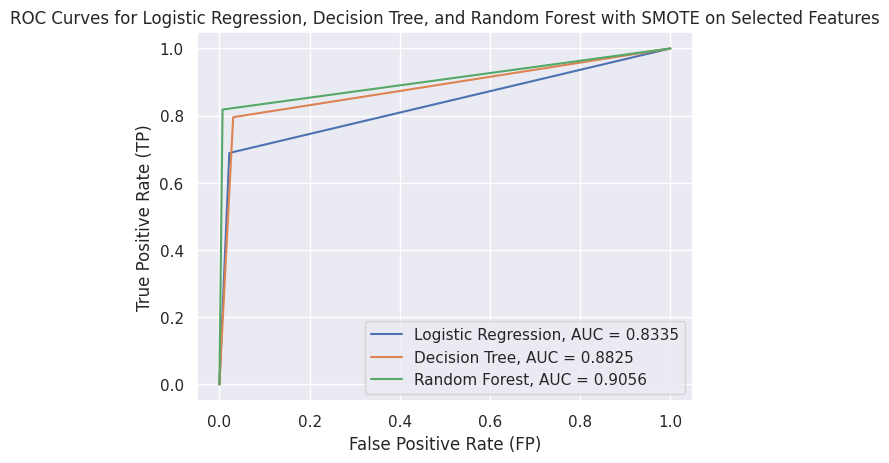

In [ ]:
plt.figure(0).clf()
fp, tp,_ = roc_curve(y3_test, y_pred_logSmote_SelectFeat)
auc = round(roc_auc_score(y3_test, y_pred_logSmote_SelectFeat), 4)
plt.plot(fp, tp, label = 'Logistic Regression, AUC = '+str(auc))

fp, tp,_ = roc_curve(y3_test, y_pred_treeSmote_SelectFeat)
auc = round(roc_auc_score(y3_test, y_pred_treeSmote_SelectFeat), 4)
plt.plot(fp, tp, label = 'Decision Tree, AUC = '+str(auc))

fp, tp,_ = roc_curve(y3_test, y_pred_RFSmote_SelectFeat)
auc = round(roc_auc_score(y3_test, y_pred_RFSmote_SelectFeat), 4)
plt.plot(fp, tp, label = 'Random Forest, AUC = '+str(auc))

plt.title('ROC Curves for Logistic Regression, Decision Tree, and Random Forest with SMOTE on Selected Features')
plt.ylabel('True Positive Rate (TP)')
plt.xlabel('False Positive Rate (FP)')
plt.legend()

**D) Dataset with no outliers on selected features**

In [ ]:
y4 = fraud_no_outliers_SelectFeat.is_fraud
col = 'is_fraud'
X4 = fraud_no_outliers_SelectFeat.loc[:, fraud_no_outliers_SelectFeat.columns != col]

In [ ]:
skf = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 300)

In [ ]:
X4_train, X4_test, y4_train, y4_test = train_test_split(X4, y4, test_size = 0.3, random_state = 300)

1. Under Sampling

Logistic Regression

In [ ]:
rus_log_pipeline = imbpipeline(steps = [['RandomUnderSampler', RandomUnderSampler(sampling_strategy = 'majority',random_state = 300)],
                                      ['LogisticRegression', LogisticRegression(random_state = 300)]])

In [ ]:
log_param = {
    'LogisticRegression__C': [1.0, 0.1, 0.01, 0.001]
}
log_grid_rus_NoOut = RandomizedSearchCV(rus_log_pipeline, param_distributions = log_param, n_iter = 5 , cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
log_grid_rus_NoOut = log_grid_rus_NoOut.fit(X4_train, y4_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 4 is smaller than n_iter=5. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Execution time: 00:00:36


In [ ]:
log_grid_rus_NoOut.best_estimator_

Pipeline(steps=[('RandomUnderSampler',
                 RandomUnderSampler(random_state=300,
                                    sampling_strategy='majority')),
                ['LogisticRegression',
                 LogisticRegression(C=0.001, random_state=300)]])

In [ ]:
y_pred_logrus_NoOut_SelectFeat = log_grid_rus_NoOut.best_estimator_.predict(X4_test)

In [ ]:
matthews_corrcoef(y4_test, y_pred_logrus_NoOut_SelectFeat)

0.035658982149608276

In [ ]:
f1_score(y4_test, y_pred_logrus_NoOut_SelectFeat)

0.007179230319726187

In [ ]:
confusion = confusion_matrix(y4_test, y_pred_logrus_NoOut_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[256717  94991]
 [   153    344]]
TP:  344 , FP:  94991 , TN:  256717 , FN: 153


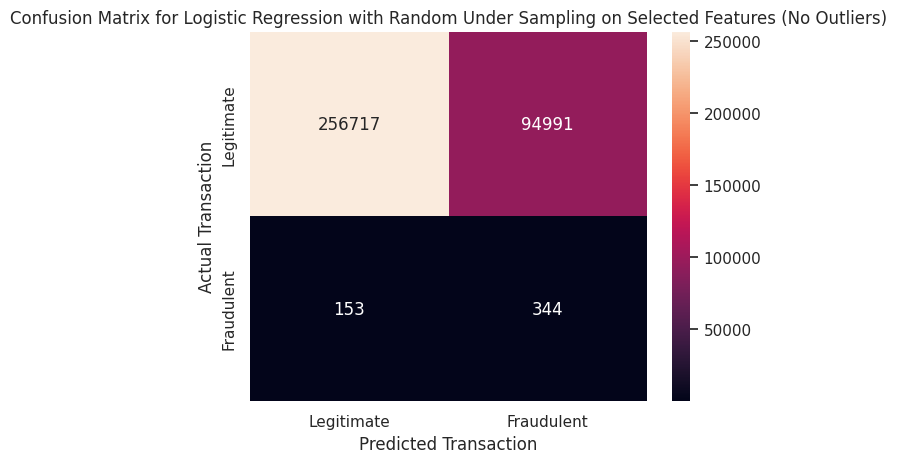

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Logistic Regression with Random Under Sampling on Selected Features (No Outliers)')
plt.show()

In [ ]:
print(classification_report(y4_test, y_pred_logrus_NoOut_SelectFeat ))

              precision    recall  f1-score   support

           0       1.00      0.73      0.84    351708
           1       0.00      0.69      0.01       497

    accuracy                           0.73    352205
   macro avg       0.50      0.71      0.43    352205
weighted avg       1.00      0.73      0.84    352205



Decision Tree

In [ ]:
rus_tree_pipeline = imbpipeline(steps = [['RandomUnderSampler', RandomUnderSampler(sampling_strategy = 'majority',random_state = 300)],
                                      ['DecisionTree', tree.DecisionTreeClassifier(random_state = 300)]])

In [ ]:
tree_param = {
    'DecisionTree__criterion': ['gini', 'entropy'],
    'DecisionTree__max_depth': [5, 10, 20, 25]
}
tree_grid_rus_NoOut = RandomizedSearchCV(rus_tree_pipeline, param_distributions = tree_param, n_iter = 5, cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
tree_grid_rus_NoOut = tree_grid_rus_NoOut.fit(X4_train, y4_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:00:40


In [ ]:
tree_grid_rus_NoOut.best_estimator_

Pipeline(steps=[('RandomUnderSampler',
                 RandomUnderSampler(random_state=300,
                                    sampling_strategy='majority')),
                ['DecisionTree',
                 DecisionTreeClassifier(criterion='entropy', max_depth=25,
                                        random_state=300)]])

In [ ]:
y_pred_treerus_NoOut_SelectFeat = tree_grid_rus_NoOut.best_estimator_.predict(X4_test)

In [ ]:
matthews_corrcoef(y4_test, y_pred_treerus_NoOut_SelectFeat)

0.09455770243684807

In [ ]:
f1_score(y4_test, y_pred_treerus_NoOut_SelectFeat)

0.022335375003074802

In [ ]:
confusion = confusion_matrix(y4_test, y_pred_treerus_NoOut_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[312006  39702]
 [    43    454]]
TP:  454 , FP:  39702 , TN:  312006 , FN: 43


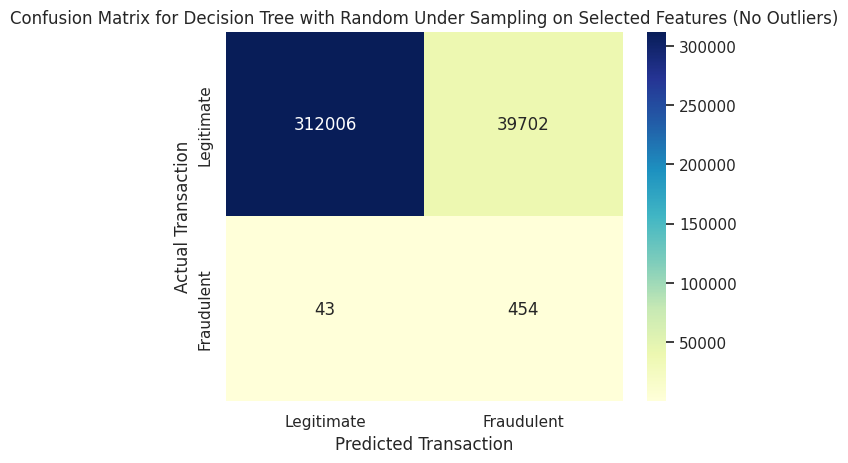

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'YlGnBu')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Decision Tree with Random Under Sampling on Selected Features (No Outliers)')
plt.show()

In [ ]:
print(classification_report(y4_test, y_pred_treerus_NoOut_SelectFeat ))

              precision    recall  f1-score   support

           0       1.00      0.89      0.94    351708
           1       0.01      0.91      0.02       497

    accuracy                           0.89    352205
   macro avg       0.51      0.90      0.48    352205
weighted avg       1.00      0.89      0.94    352205



Random Forest

In [ ]:
rus_RanFor_pipeline = imbpipeline(steps = [['RandomUnderSampler', RandomUnderSampler(sampling_strategy = 'majority',random_state = 300)],
                                      ['RandomForest', RandomForestClassifier(random_state = 300)]])

In [ ]:
RanFor_param = {
    'RandomForest__n_estimators': [100, 200],
    'RandomForest__criterion': ['gini', 'entropy'],
    'RandomForest__max_depth': [5, 10, 20, 25]
}
RanFor_grid_rus_NoOut = RandomizedSearchCV(rus_RanFor_pipeline, param_distributions = RanFor_param, n_iter = 5 ,cv = skf, scoring = 'precision', return_train_score = True  )

In [ ]:
start_time = time.time()
RanFor_grid_rus_NoOut = RanFor_grid_rus_NoOut.fit(X4_train, y4_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:06:49


In [ ]:
RanFor_grid_rus_NoOut.best_estimator_

Pipeline(steps=[('RandomUnderSampler',
                 RandomUnderSampler(random_state=300,
                                    sampling_strategy='majority')),
                ['RandomForest',
                 RandomForestClassifier(max_depth=25, random_state=300)]])

In [ ]:
y_pred_RFrus_NoOut_SelectFeat = RanFor_grid_rus_NoOut.best_estimator_.predict(X4_test)

In [ ]:
matthews_corrcoef(y4_test, y_pred_RFrus_NoOut_SelectFeat)

0.1015353375079917

In [ ]:
f1_score(y4_test, y_pred_RFrus_NoOut_SelectFeat)

0.02447744056783487

In [ ]:
confusion = confusion_matrix(y4_test, y_pred_RFrus_NoOut_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[314353  37355]
 [    28    469]]
TP:  469 , FP:  37355 , TN:  314353 , FN: 28


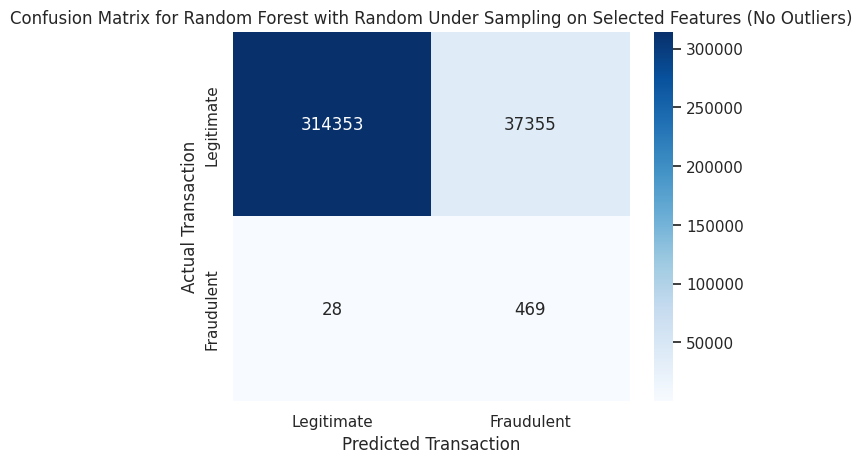

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'Blues')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Random Forest with Random Under Sampling on Selected Features (No Outliers)')
plt.show()

In [ ]:
print(classification_report(y4_test, y_pred_RFrus_NoOut_SelectFeat))

              precision    recall  f1-score   support

           0       1.00      0.89      0.94    351708
           1       0.01      0.94      0.02       497

    accuracy                           0.89    352205
   macro avg       0.51      0.92      0.48    352205
weighted avg       1.00      0.89      0.94    352205



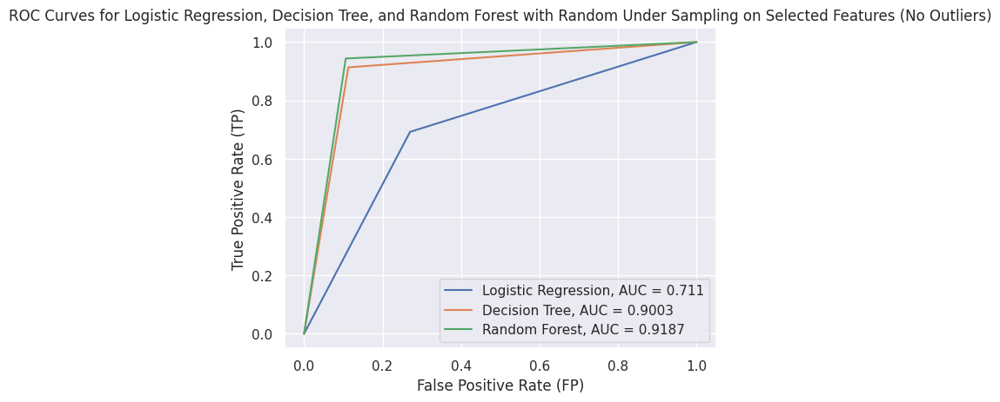

In [ ]:
plt.figure(0).clf()
fp, tp,_ = roc_curve(y4_test, y_pred_logrus_NoOut_SelectFeat)
auc = round(roc_auc_score(y4_test, y_pred_logrus_NoOut_SelectFeat), 4)
plt.plot(fp, tp, label = 'Logistic Regression, AUC = '+str(auc))

fp, tp,_ = roc_curve(y4_test, y_pred_treerus_NoOut_SelectFeat)
auc = round(roc_auc_score(y4_test, y_pred_treerus_NoOut_SelectFeat), 4)
plt.plot(fp, tp, label = 'Decision Tree, AUC = '+str(auc))

fp, tp,_ = roc_curve(y4_test, y_pred_RFrus_NoOut_SelectFeat)
auc = round(roc_auc_score(y4_test, y_pred_RFrus_NoOut_SelectFeat), 4)
plt.plot(fp, tp, label = 'Random Forest, AUC = '+str(auc))

plt.title('ROC Curves for Logistic Regression, Decision Tree, and Random Forest with Random Under Sampling on Selected Features (No Outliers)')
plt.ylabel('True Positive Rate (TP)')
plt.xlabel('False Positive Rate (FP)')
plt.legend()

2. Over Sampling

Logistic Regression

In [ ]:
ros_log_pipeline = imbpipeline(steps = [['RandomOverSampler', RandomOverSampler(sampling_strategy = 'minority',random_state = 300)],
                                      ['LogisticRegression', LogisticRegression(random_state = 300)]])

In [ ]:
log_param = {
    'LogisticRegression__C': [1.0, 0.1, 0.01, 0.001]
}
log_grid_ros_NoOut = RandomizedSearchCV(ros_log_pipeline, param_distributions = log_param, n_iter = 5 , cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
log_grid_ros_NoOut = log_grid_ros_NoOut.fit(X4_train, y4_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

In [ ]:
log_grid_ros_NoOut.best_estimator_

Pipeline(steps=[('RandomOverSampler',
                 RandomOverSampler(random_state=300,
                                   sampling_strategy='minority')),
                ['LogisticRegression',
                 LogisticRegression(C=0.001, random_state=300)]])

In [ ]:
y_pred_logros_NoOut_SelectFeat = log_grid_ros_NoOut.best_estimator_.predict(X4_test)

In [ ]:
matthews_corrcoef(y4_test, y_pred_logros_NoOut_SelectFeat)

0.040435838161668805

In [ ]:
f1_score(y4_test, y_pred_logros_NoOut_SelectFeat)

0.006705607300993061

In [ ]:
confusion = confusion_matrix(y4_test, y_pred_logros_NoOut_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[219628 132080]
 [    51    446]]
TP:  446 , FP:  132080 , TN:  219628 , FN: 51


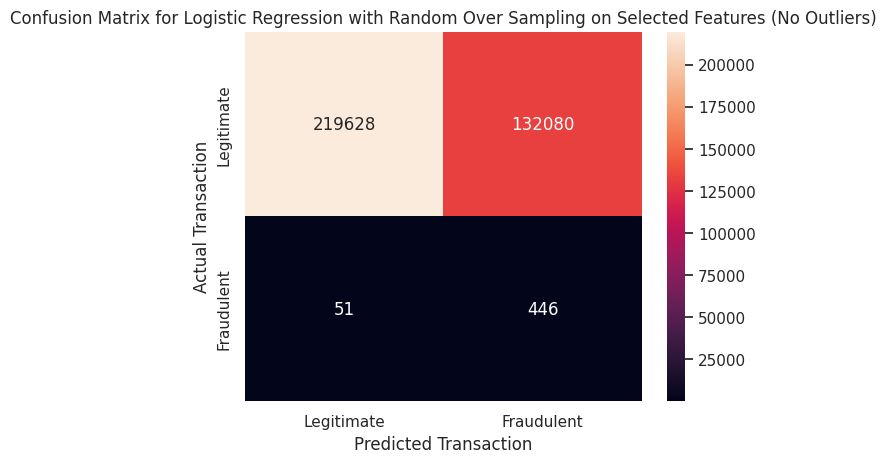

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Logistic Regression with Random Over Sampling on Selected Features (No Outliers)')
plt.show()

In [ ]:
print(classification_report(y4_test, y_pred_logros_NoOut_SelectFeat))

              precision    recall  f1-score   support

           0       1.00      0.62      0.77    351708
           1       0.00      0.90      0.01       497

    accuracy                           0.62    352205
   macro avg       0.50      0.76      0.39    352205
weighted avg       1.00      0.62      0.77    352205



Decision Tree

In [ ]:
ros_tree_pipeline = imbpipeline(steps = [['RandomOverSampler', RandomOverSampler(sampling_strategy = 'minority',random_state = 300)],
                                      ['DecisionTree', tree.DecisionTreeClassifier(random_state = 300)]])

In [ ]:
tree_param = {
    'DecisionTree__criterion': ['gini', 'entropy'],
    'DecisionTree__max_depth': [5, 10, 20, 25]
}
tree_grid_ros_NoOut = RandomizedSearchCV(ros_tree_pipeline, param_distributions = tree_param, n_iter = 5, cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
tree_grid_ros_NoOut = tree_grid_ros_NoOut.fit(X4_train, y4_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:11:13


In [ ]:
tree_grid_ros_NoOut.best_estimator_

Pipeline(steps=[('RandomOverSampler',
                 RandomOverSampler(random_state=300,
                                   sampling_strategy='minority')),
                ['DecisionTree',
                 DecisionTreeClassifier(criterion='entropy', max_depth=25,
                                        random_state=300)]])

In [ ]:
y_pred_treeros_NoOut_SelectFeat = tree_grid_ros_NoOut.best_estimator_.predict(X4_test)

In [ ]:
matthews_corrcoef(y4_test, y_pred_treeros_NoOut_SelectFeat)

0.17736679639971872

In [ ]:
f1_score(y4_test, y_pred_treeros_NoOut_SelectFeat)

0.10051107325383304

In [ ]:
confusion = confusion_matrix(y4_test, y_pred_treeros_NoOut_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[346630   5078]
 [   202    295]]
TP:  295 , FP:  5078 , TN:  346630 , FN: 202


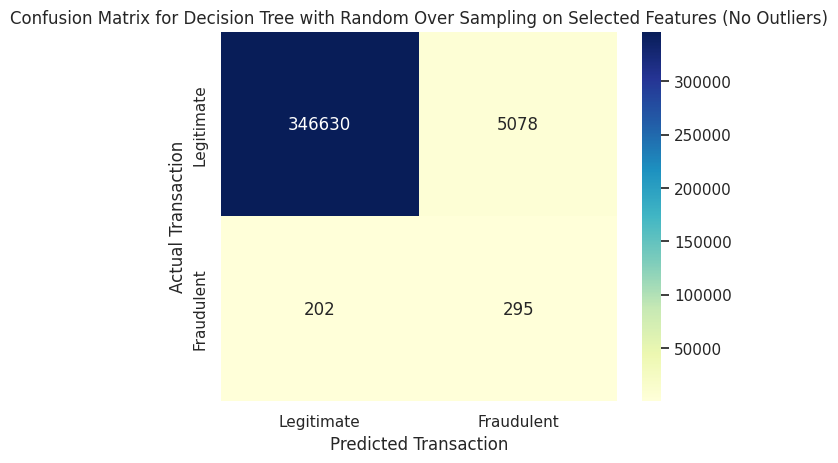

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'YlGnBu')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Decision Tree with Random Over Sampling on Selected Features (No Outliers)')
plt.show()

In [ ]:
print(classification_report(y4_test, y_pred_treeros_NoOut_SelectFeat))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99    351708
           1       0.05      0.59      0.10       497

    accuracy                           0.99    352205
   macro avg       0.53      0.79      0.55    352205
weighted avg       1.00      0.99      0.99    352205



Random Forest

In [ ]:
ros_RanFor_pipeline = imbpipeline(steps = [['RandomOverSampler', RandomOverSampler(sampling_strategy = 'minority',random_state = 300)],
                                      ['RandomForest', RandomForestClassifier(random_state = 300)]])

In [ ]:
RanFor_param = {
    'RandomForest__n_estimators': [100, 200],
    'RandomForest__criterion': ['gini', 'entropy'],
    'RandomForest__max_depth': [5, 10, 20, 25]
}
RanFor_grid_ros_NoOut = RandomizedSearchCV(ros_RanFor_pipeline, param_distributions = RanFor_param, n_iter = 5 ,cv = skf, scoring = 'precision', return_train_score = True  )

In [ ]:
start_time = time.time()
RanFor_grid_ros_NoOut = RanFor_grid_ros_NoOut.fit(X4_train, y4_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 02:06:39


In [ ]:
RanFor_grid_ros_NoOut.best_estimator_

Pipeline(steps=[('RandomOverSampler',
                 RandomOverSampler(random_state=300,
                                   sampling_strategy='minority')),
                ['RandomForest',
                 RandomForestClassifier(max_depth=25, n_estimators=200,
                                        random_state=300)]])

In [ ]:
y_pred_RFros_NoOut_SelectFeat = RanFor_grid_ros_NoOut.best_estimator_.predict(X4_test)

In [ ]:
matthews_corrcoef(y4_test, y_pred_RFros_NoOut_SelectFeat)

0.25913368379395885

In [ ]:
f1_score(y4_test, y_pred_RFros_NoOut_SelectFeat)

0.19173660426081346

In [ ]:
confusion = confusion_matrix(y4_test, y_pred_RFros_NoOut_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[349404   2304]
 [   200    297]]
TP:  297 , FP:  2304 , TN:  349404 , FN: 200


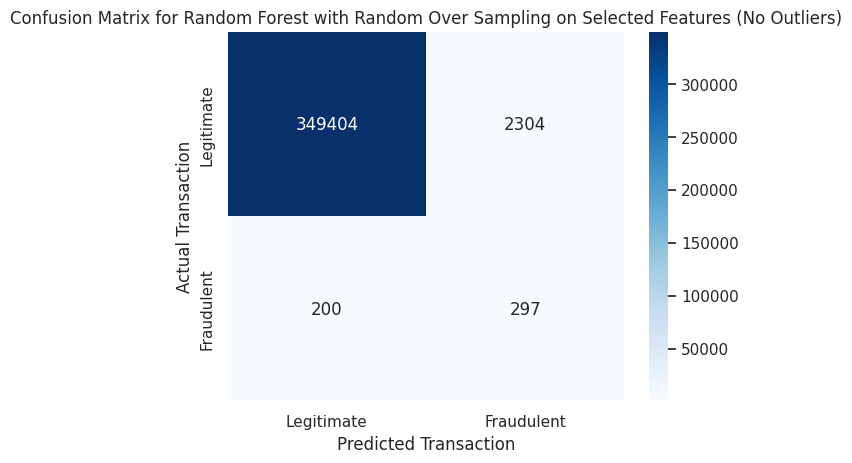

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'Blues')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Random Forest with Random Over Sampling on Selected Features (No Outliers)')
plt.show()

In [ ]:
print(classification_report(y4_test, y_pred_RFros_NoOut_SelectFeat))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00    351708
           1       0.11      0.60      0.19       497

    accuracy                           0.99    352205
   macro avg       0.56      0.80      0.59    352205
weighted avg       1.00      0.99      1.00    352205



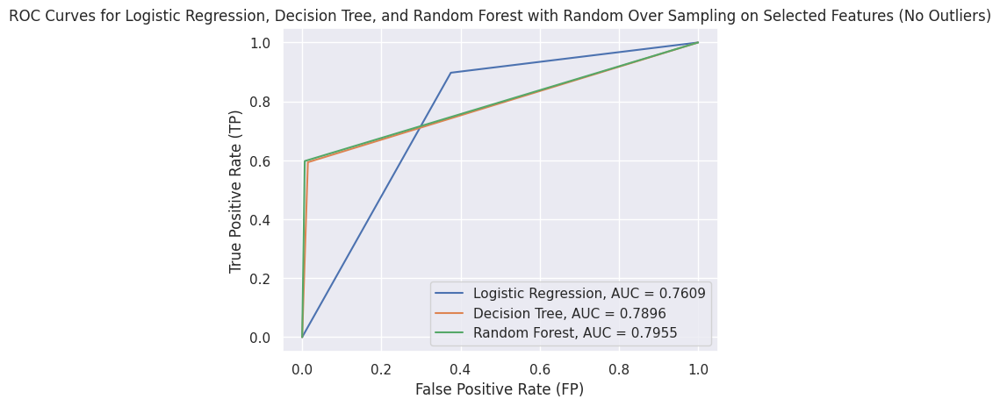

In [ ]:
plt.figure(0).clf()
fp, tp,_ = roc_curve(y4_test, y_pred_logros_NoOut_SelectFeat)
auc = round(roc_auc_score(y4_test, y_pred_logros_NoOut_SelectFeat), 4)
plt.plot(fp, tp, label = 'Logistic Regression, AUC = '+str(auc))

fp, tp,_ = roc_curve(y4_test, y_pred_treeros_NoOut_SelectFeat)
auc = round(roc_auc_score(y4_test, y_pred_treeros_NoOut_SelectFeat), 4)
plt.plot(fp, tp, label = 'Decision Tree, AUC = '+str(auc))

fp, tp,_ = roc_curve(y4_test, y_pred_RFros_NoOut_SelectFeat)
auc = round(roc_auc_score(y4_test, y_pred_RFros_NoOut_SelectFeat), 4)
plt.plot(fp, tp, label = 'Random Forest, AUC = '+str(auc))

plt.title('ROC Curves for Logistic Regression, Decision Tree, and Random Forest with Random Over Sampling on Selected Features (No Outliers)')
plt.ylabel('True Positive Rate (TP)')
plt.xlabel('False Positive Rate (FP)')
plt.legend()

3. SMOTE

Logistic Regression

In [ ]:
smote_log_pipeline = imbpipeline(steps = [['SMOTE', SMOTE(random_state = 300)],
                                      ['LogisticRegression', LogisticRegression(random_state = 300)]])

In [ ]:
log_param = {
    'LogisticRegression__C': [1.0, 0.1, 0.01, 0.001]
}
log_grid_smote_NoOut = RandomizedSearchCV(smote_log_pipeline, param_distributions = log_param, n_iter = 5 , cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
log_grid_smote_NoOut = log_grid_smote_NoOut.fit(X4_train, y4_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

In [ ]:
log_grid_smote_NoOut.best_estimator_

Pipeline(steps=[('SMOTE', SMOTE(random_state=300)),
                ['LogisticRegression',
                 LogisticRegression(C=0.001, random_state=300)]])

In [ ]:
y_pred_logSmote_NoOut_SelectFeat = log_grid_smote_NoOut.best_estimator_.predict(X4_test)

In [ ]:
matthews_corrcoef(y4_test, y_pred_logSmote_NoOut_SelectFeat)

0.038057284670704974

In [ ]:
f1_score(y4_test, y_pred_logSmote_NoOut_SelectFeat)

0.008632754378986756

In [ ]:
confusion = confusion_matrix(y4_test, y_pred_logSmote_NoOut_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[284617  67091]
 [   204    293]]
TP:  293 , FP:  67091 , TN:  284617 , FN: 204


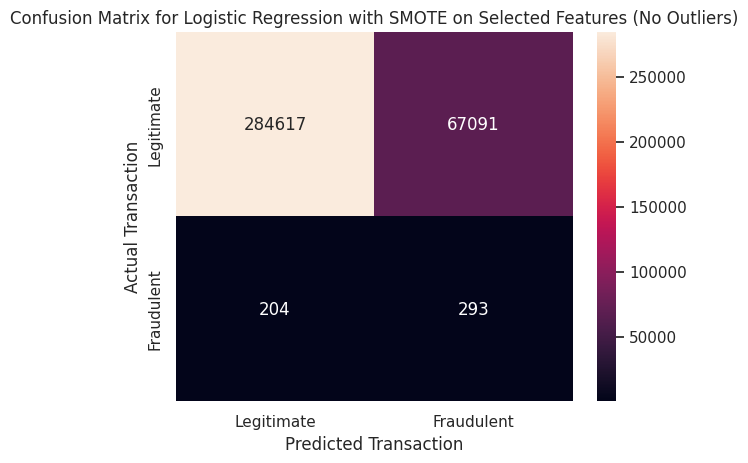

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Logistic Regression with SMOTE on Selected Features (No Outliers)')
plt.show()

In [ ]:
print(classification_report(y4_test, y_pred_logSmote_NoOut_SelectFeat))

              precision    recall  f1-score   support

           0       1.00      0.81      0.89    351708
           1       0.00      0.59      0.01       497

    accuracy                           0.81    352205
   macro avg       0.50      0.70      0.45    352205
weighted avg       1.00      0.81      0.89    352205



Decision Tree

In [ ]:
smote_tree_pipeline = imbpipeline(steps = [['SMOTE', SMOTE(random_state = 300)],
                                      ['DecisionTree', tree.DecisionTreeClassifier(random_state = 300)]])

In [ ]:
tree_param = {
    'DecisionTree__criterion': ['gini', 'entropy'],
    'DecisionTree__max_depth': [5, 10, 20, 25]
}
tree_grid_smote_NoOut = RandomizedSearchCV(smote_tree_pipeline, param_distributions = tree_param, n_iter = 5, cv = skf, scoring = 'precision', return_train_score = True)

In [ ]:
start_time = time.time()
tree_grid_smote_NoOut = tree_grid_smote_NoOut.fit(X4_train, y4_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 00:12:21


In [ ]:
tree_grid_smote_NoOut.best_estimator_

Pipeline(steps=[('SMOTE', SMOTE(random_state=300)),
                ['DecisionTree',
                 DecisionTreeClassifier(max_depth=25, random_state=300)]])

In [ ]:
y_pred_treeSmote_NoOut_SelectFeat = tree_grid_smote_NoOut.best_estimator_.predict(X4_test)

In [ ]:
matthews_corrcoef(y4_test, y_pred_treeSmote_NoOut_SelectFeat)

0.09950483971861869

In [ ]:
f1_score(y4_test, y_pred_treeSmote_NoOut_SelectFeat)

0.03046464991253147

In [ ]:
confusion = confusion_matrix(y4_test, y_pred_treeSmote_NoOut_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[329125  22583]
 [   140    357]]
TP:  357 , FP:  22583 , TN:  329125 , FN: 140


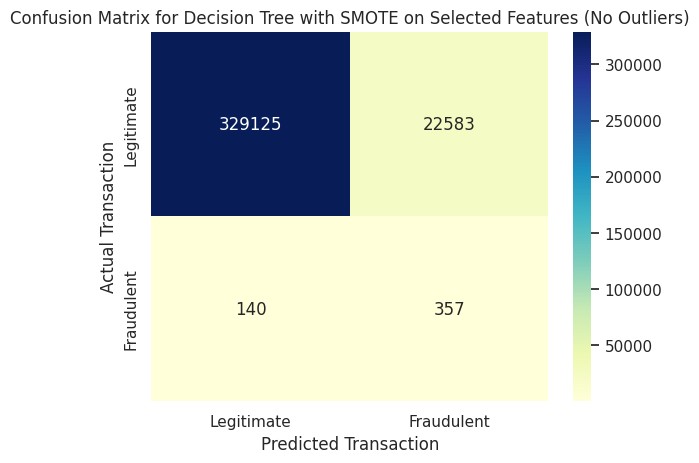

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'YlGnBu')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Decision Tree with SMOTE on Selected Features (No Outliers)')
plt.show()

In [ ]:
print(classification_report(y4_test, y_pred_treeSmote_NoOut_SelectFeat))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97    351708
           1       0.02      0.72      0.03       497

    accuracy                           0.94    352205
   macro avg       0.51      0.83      0.50    352205
weighted avg       1.00      0.94      0.97    352205



Random Forest

In [ ]:
smote_RanFor_pipeline = imbpipeline(steps = [['SMOTE', SMOTE(random_state = 300)],
                                      ['RandomForest', RandomForestClassifier(random_state = 300)]])

In [ ]:
RanFor_param = {
    'RandomForest__n_estimators': [100, 200],
    'RandomForest__criterion': ['gini', 'entropy'],
    'RandomForest__max_depth': [5, 10, 20, 25]
}
RanFor_grid_smote_NoOut = RandomizedSearchCV(smote_RanFor_pipeline, param_distributions = RanFor_param, n_iter = 5 ,cv = skf, scoring = 'precision', return_train_score = True  )

In [ ]:
start_time = time.time()
RanFor_grid_smote_NoOut = RanFor_grid_smote_NoOut.fit(X4_train, y4_train)
end_time = time.time() - start_time
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(end_time)))

Execution time: 03:05:49


In [ ]:
RanFor_grid_smote_NoOut.best_estimator_

Pipeline(steps=[('SMOTE', SMOTE(random_state=300)),
                ['RandomForest',
                 RandomForestClassifier(max_depth=20, n_estimators=200,
                                        random_state=300)]])

In [ ]:
y_pred_RFSmote_NoOut_SelectFeat = RanFor_grid_smote_NoOut.best_estimator_.predict(X4_test)

In [ ]:
matthews_corrcoef(y4_test, y_pred_RFSmote_NoOut_SelectFeat)

0.10096030663370324

In [ ]:
f1_score(y4_test, y_pred_RFSmote_NoOut_SelectFeat)

0.030094652536202575

In [ ]:
confusion = confusion_matrix(y4_test, y_pred_RFSmote_NoOut_SelectFeat)
print(confusion)
tn, fp, fn, tp=confusion.ravel()
print('TP: ', tp,', FP: ', fp,', TN: ', tn,', FN:', fn)

[[327855  23853]
 [   125    372]]
TP:  372 , FP:  23853 , TN:  327855 , FN: 125


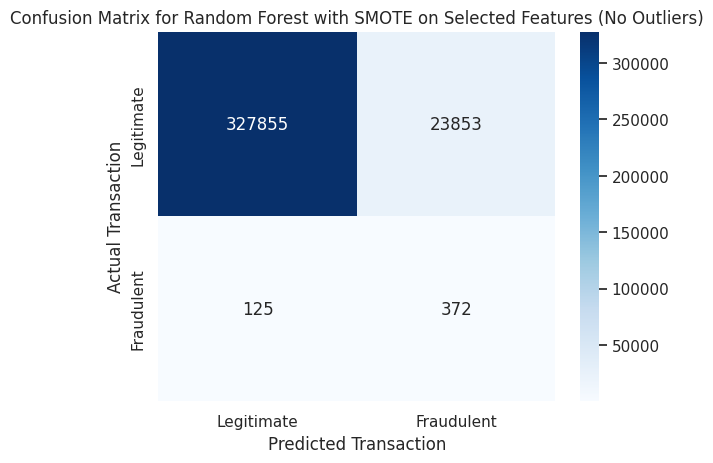

In [ ]:
sns.set(font_scale = 1)
conf_matrix = sns.heatmap(confusion, annot = True, fmt = 'd', cmap = 'Blues')
conf_matrix.set_xlabel('Predicted Transaction', fontsize = 12)
conf_matrix.xaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_ylabel('Actual Transaction', fontsize = 12)
conf_matrix.yaxis.set_ticklabels(['Legitimate', 'Fraudulent'])

conf_matrix.set_title('Confusion Matrix for Random Forest with SMOTE on Selected Features (No Outliers)')
plt.show()

In [ ]:
print(classification_report(y4_test, y_pred_RFSmote_NoOut_SelectFeat))

              precision    recall  f1-score   support

           0       1.00      0.93      0.96    351708
           1       0.02      0.75      0.03       497

    accuracy                           0.93    352205
   macro avg       0.51      0.84      0.50    352205
weighted avg       1.00      0.93      0.96    352205



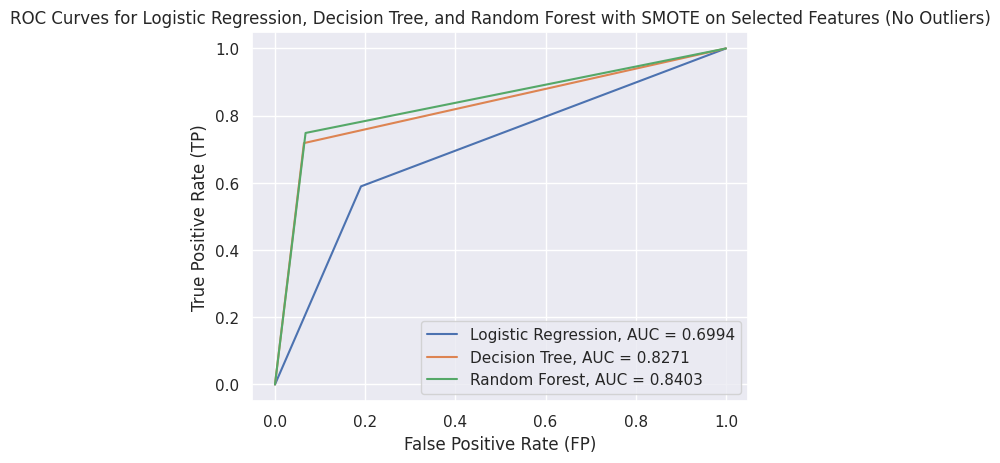

In [ ]:
plt.figure(0).clf()
fp, tp,_ = roc_curve(y4_test, y_pred_logSmote_NoOut_SelectFeat)
auc = round(roc_auc_score(y4_test, y_pred_logSmote_NoOut_SelectFeat), 4)
plt.plot(fp, tp, label = 'Logistic Regression, AUC = '+str(auc))

fp, tp,_ = roc_curve(y4_test, y_pred_treeSmote_NoOut_SelectFeat)
auc = round(roc_auc_score(y4_test, y_pred_treeSmote_NoOut_SelectFeat), 4)
plt.plot(fp, tp, label = 'Decision Tree, AUC = '+str(auc))

fp, tp,_ = roc_curve(y4_test, y_pred_RFSmote_NoOut_SelectFeat)
auc = round(roc_auc_score(y4_test, y_pred_RFSmote_NoOut_SelectFeat), 4)
plt.plot(fp, tp, label = 'Random Forest, AUC = '+str(auc))

plt.title('ROC Curves for Logistic Regression, Decision Tree, and Random Forest with SMOTE on Selected Features (No Outliers)')
plt.ylabel('True Positive Rate (TP)')
plt.xlabel('False Positive Rate (FP)')
plt.legend()

In [ ]:
#!apt-get install texlive-xetex texlive-fonts-recommended texlive-plain-generic

!jupyter nbconvert --to pdf /content/Final_Code.ipynb